In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import acf
from statsmodels.tsa.stattools import pacf
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
import statsmodels.api as sm
from statsmodels.tsa.statespace.sarimax import SARIMAX, SARIMAXResults

# Data Preprocessing

In [70]:
#df=pd.read_csv(r"Walmart (1).csv")
df = pd.read_csv("Walmart_old.csv")

In [71]:
df

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106
...,...,...,...,...,...,...,...,...
6430,45,28-09-2012,713173.95,0,64.88,3.997,192.013558,8.684
6431,45,05-10-2012,733455.07,0,64.89,3.985,192.170412,8.667
6432,45,12-10-2012,734464.36,0,54.47,4.000,192.327265,8.667
6433,45,19-10-2012,718125.53,0,56.47,3.969,192.330854,8.667


# Feature Name               &                                             Description

- **Store**           :                                  Store number
- **Date**         :                                      Week of Sales
- **Weekly_Sales** :                                      Sales for the given store in that week
- **Holiday_Flag**  :                                    If it is a holiday week
- **Temperature**    :                                    Temperature on the day of the sale
- **Fuel_Price**     :                                  Cost of the fuel in the region
- **CPI Consumer**  :                                    Price Index
- **Unemployment**    :                                   Unemployment Rate


# Exploratory Data Analysis(EDA)

In [72]:
df.shape

(6435, 8)

In [73]:
df.columns

Index(['Store', 'Date', 'Weekly_Sales', 'Holiday_Flag', 'Temperature',
       'Fuel_Price', 'CPI', 'Unemployment'],
      dtype='object')

In [74]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   int64  
 1   Date          6435 non-null   object 
 2   Weekly_Sales  6435 non-null   float64
 3   Holiday_Flag  6435 non-null   int64  
 4   Temperature   6435 non-null   float64
 5   Fuel_Price    6435 non-null   float64
 6   CPI           6435 non-null   float64
 7   Unemployment  6435 non-null   float64
dtypes: float64(5), int64(2), object(1)
memory usage: 402.3+ KB


In [75]:
df.describe()

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
count,6435.000000,6.435000e+03,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000
mean,23.000000,1.046965e+06,0.069930,60.663782,3.358607,171.578394,7.999151
std,12.988182,5.643666e+05,0.255049,18.444933,0.459020,39.356712,1.875885
min,1.000000,2.099862e+05,0.000000,-2.060000,2.472000,126.064000,3.879000
25%,12.000000,5.533501e+05,0.000000,47.460000,2.933000,131.735000,6.891000
50%,23.000000,9.607460e+05,0.000000,62.670000,3.445000,182.616521,7.874000
75%,34.000000,1.420159e+06,0.000000,74.940000,3.735000,212.743293,8.622000
max,45.000000,3.818686e+06,1.000000,100.140000,4.468000,227.232807,14.313000


In [76]:
df.isnull().sum()

Store           0
Date            0
Weekly_Sales    0
Holiday_Flag    0
Temperature     0
Fuel_Price      0
CPI             0
Unemployment    0
dtype: int64

In [77]:
df.duplicated().sum()

0

In [78]:
df.dtypes

Store             int64
Date             object
Weekly_Sales    float64
Holiday_Flag      int64
Temperature     float64
Fuel_Price      float64
CPI             float64
Unemployment    float64
dtype: object

In [79]:
df.Store.unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45], dtype=int64)

In [80]:
print(df.Store.nunique())
df.Store.value_counts().reset_index()  

45


,index,Store
0,1,143
1,24,143
2,26,143
3,27,143
4,28,143
5,29,143
6,30,143
7,31,143
8,32,143
9,33,143


In [81]:
print(df.Holiday_Flag.unique())
df.Holiday_Flag.value_counts()

[0 1]


0    5985
1     450
Name: Holiday_Flag, dtype: int64

In [82]:
df.Holiday_Flag

0       0
1       1
2       0
3       0
4       0
       ..
6430    0
6431    0
6432    0
6433    0
6434    0
Name: Holiday_Flag, Length: 6435, dtype: int64

#### Analzing Data by using visualization

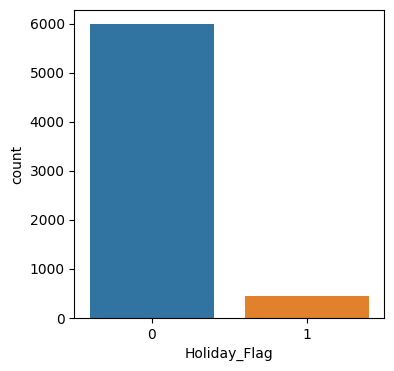

In [83]:
plt.figure(figsize=(4,4))
sns.countplot(x='Holiday_Flag', data=df)
plt.show()

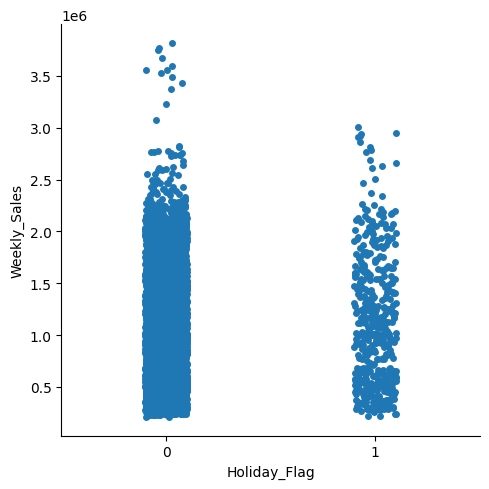

In [84]:
sns.catplot(x='Holiday_Flag', y='Weekly_Sales', data=df)
plt.show()

<AxesSubplot: xlabel='Fuel_Price'>

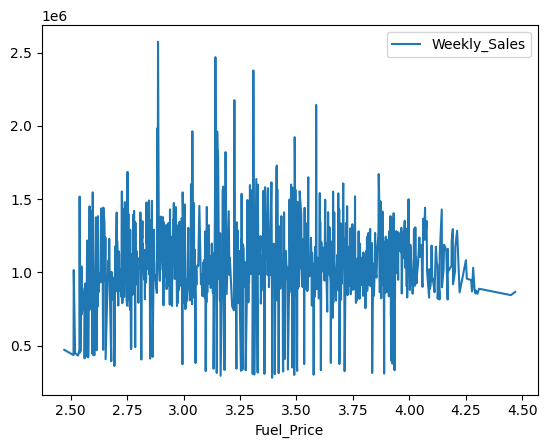

In [85]:
fuel_price = pd.pivot_table(df, values = "Weekly_Sales", index= "Fuel_Price")
fuel_price.plot()
 

<AxesSubplot: xlabel='Temperature'>

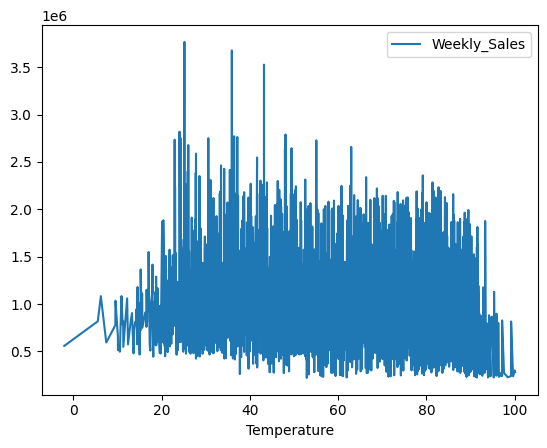

In [86]:
Temperature = pd.pivot_table(df, values = "Weekly_Sales", index= "Temperature")
Temperature.plot()

<AxesSubplot: xlabel='CPI'>

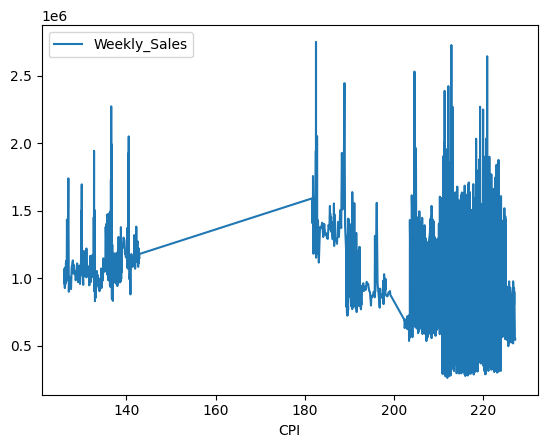

In [87]:
CPI = pd.pivot_table(df, values = "Weekly_Sales", index= "CPI")
CPI.plot()

<AxesSubplot: xlabel='Unemployment'>

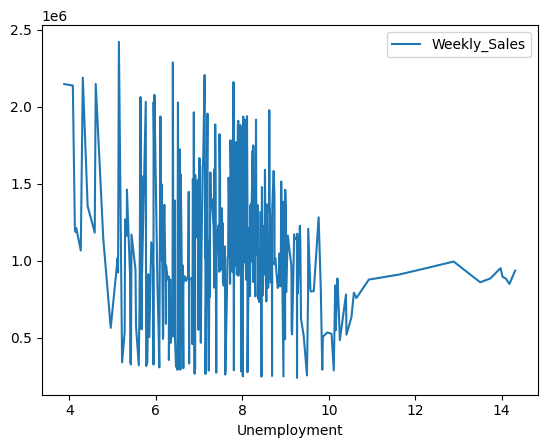

In [88]:
Unemployment=pd.pivot_table(values="Weekly_Sales",index="Unemployment",data=df)
Unemployment.plot()

### Holiday Vs Weekly Sales of all 45 stores

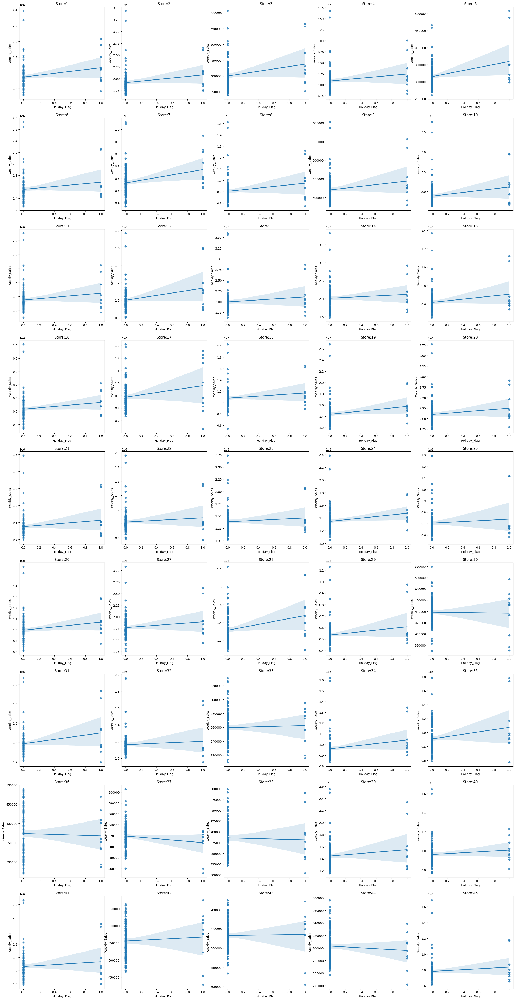

In [89]:
plt.subplots(9,5, figsize=(30,60))
for i in range (1,46):
    plt.subplot(9,5,i)
    sns.regplot(x='Holiday_Flag', y='Weekly_Sales',data=df[df['Store']==i])
    plt.title(f'Store:{i}')


### Temperature Vs Weekly Sales of all 45 stores

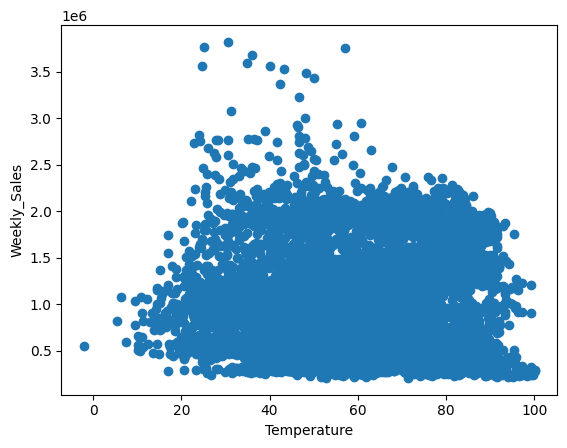

In [90]:
plt.scatter(df['Temperature'],df['Weekly_Sales'])
plt.xlabel('Temperature')
plt.ylabel("Weekly_Sales")
plt.show()

### Fuel Vs Weekly Sales of all 45 stores

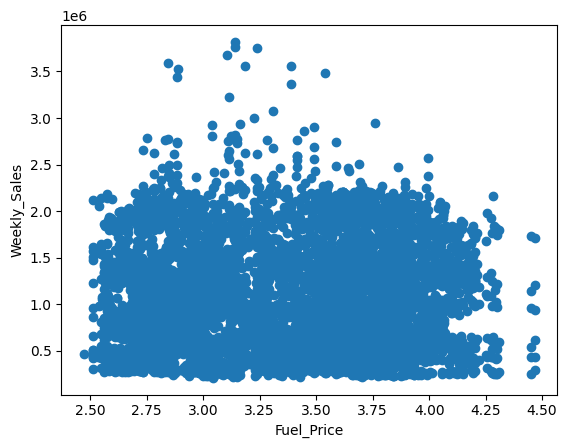

In [92]:
plt.scatter(df['Fuel_Price'],df['Weekly_Sales'])
plt.xlabel('Fuel_Price')
plt.ylabel("Weekly_Sales")
plt.show()

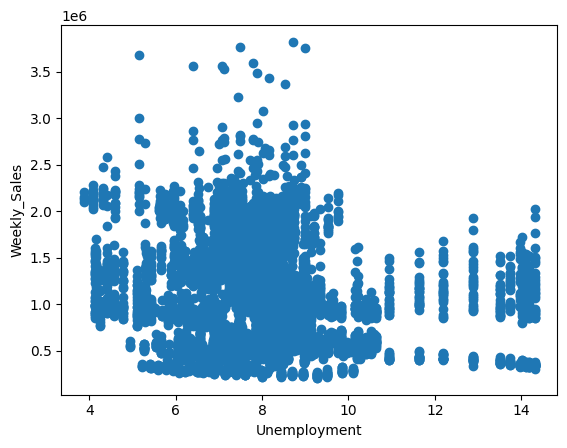

In [94]:
plt.scatter(df['Unemployment'],df['Weekly_Sales'])
plt.xlabel('Unemployment')
plt.ylabel("Weekly_Sales")
plt.show()

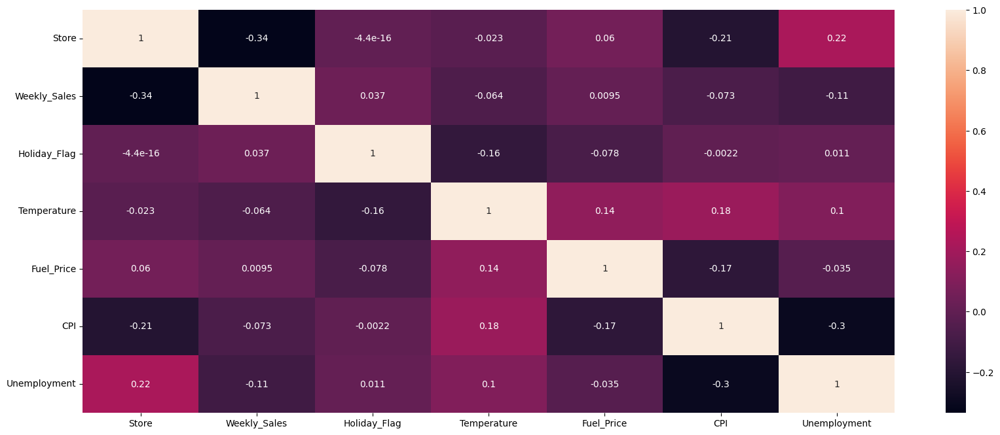

In [96]:
plt.figure(figsize=(20,8))
sns.heatmap(df.corr(),annot=True)
plt.show()

# Insights on Walmart Dataset

### A) If the weekly sales are affected by the unemployment rate, if yes - which stores are suffering the most?

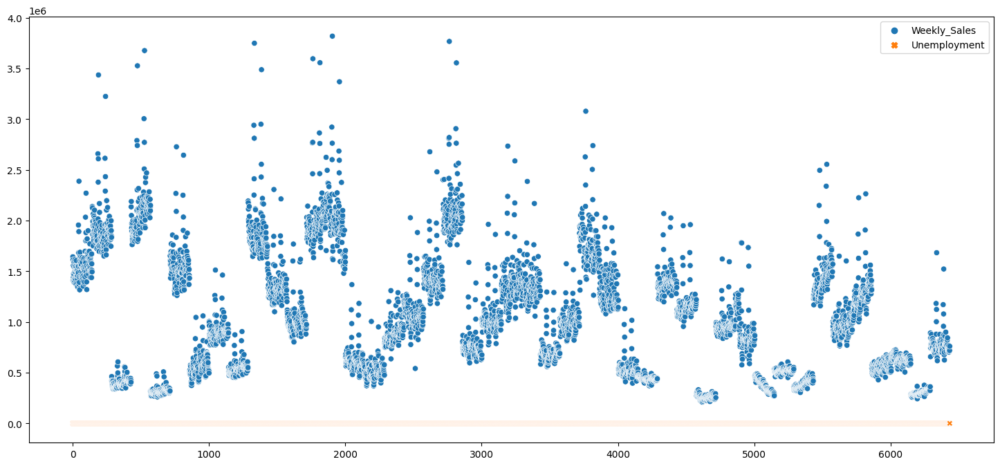

In [98]:
plt.figure(figsize=(18,8))
sns.scatterplot([df['Weekly_Sales'],df['Unemployment']])
plt.show()

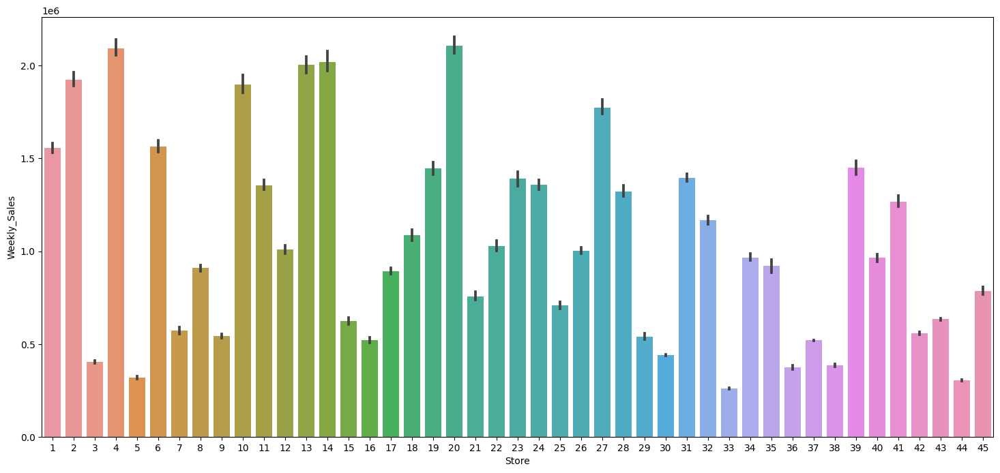

In [101]:
plt.figure(figsize=(18,8))
sns.barplot(x='Store', y='Weekly_Sales', data=df)
plt.show()

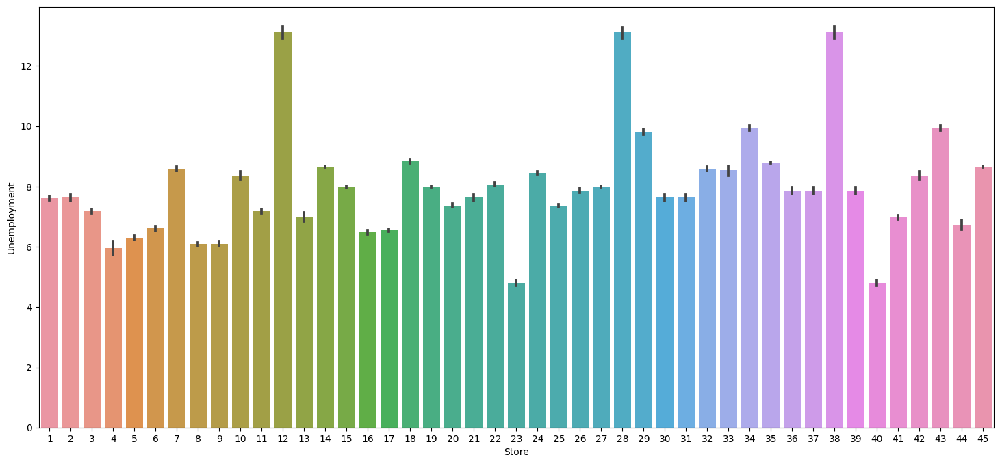

In [103]:
plt.figure(figsize=(18,8))
sns.barplot(x='Store', y='Unemployment', data=df)
plt.show()

In [104]:
Total_by_store = df.groupby('Store').agg({'Weekly_Sales': 'sum', 'Unemployment': 'sum'})
Total_by_store 

,Weekly_Sales,Unemployment
Store,,
1,2.224028e+08,1088.290
2,2.753824e+08,1090.210
3,5.758674e+07,1026.309
4,2.995440e+08,852.951
5,4.547569e+07,900.243
6,2.237561e+08,944.787
7,8.159828e+07,1227.760
8,1.299512e+08,871.134
9,7.778922e+07,872.283


In [105]:
store_correlation=df.groupby('Store')['Weekly_Sales','Unemployment'].corr()['Unemployment']
print(store_correlation.idxmin())

(38, 'Weekly_Sales')


C:\Users\praty\AppData\Local\Temp\ipykernel_28972\532463401.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  store_correlation=df.groupby('Store')['Weekly_Sales','Unemployment'].corr()['Unemployment']


- Store **12,28,38** has more unempoloyment i.e 1875.657.
- Unemployment effect is showing more on Store **38**.  

### B) If the weekly sales show a seasonal trend, when and what could be the reason?


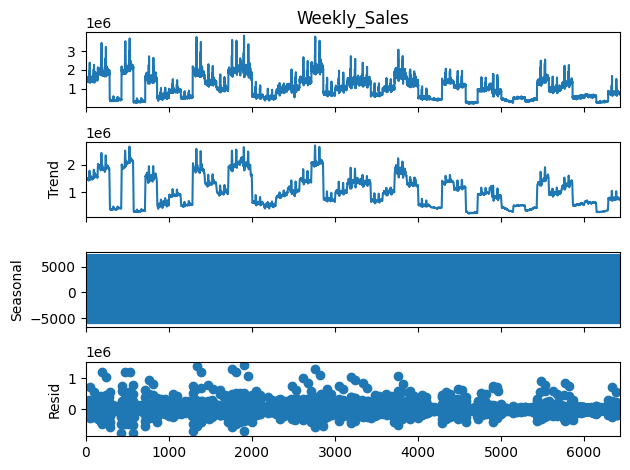

In [106]:
#seasonal Decompose
result=seasonal_decompose(df['Weekly_Sales'],model='additive', period=7)

result.plot()
plt.show()

In [107]:
#Addictive
new_df_add=pd.concat([result.seasonal,result.trend,result.resid,result.observed],axis=1)
new_df_add.columns=["seasonality","trend","residual","actual_values"]
new_df_add.head(5)


,seasonality,trend,residual,actual_values
0,-3978.147451,NaN,NaN,1643690.90
1,7215.473014,NaN,NaN,1641957.44
2,5479.430196,NaN,NaN,1611968.17
3,1547.439597,1.539173e+06,-130992.443883,1409727.59
4,-1440.045828,1.504992e+06,51254.271542,1554806.68


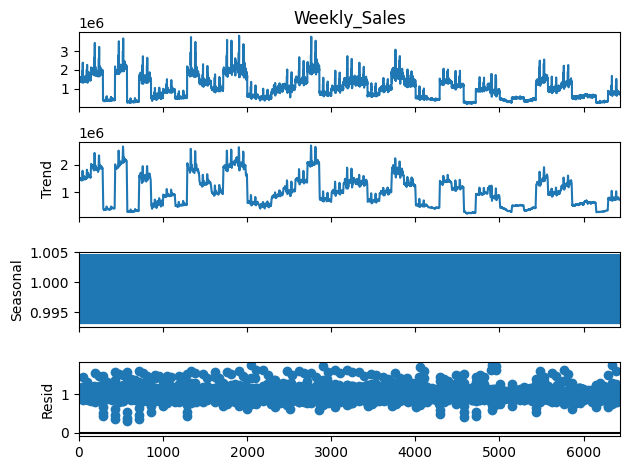

In [108]:
result=seasonal_decompose(df['Weekly_Sales'],model='multiplicative', period=7)
result.plot()
plt.show()

In [109]:
#Addictive
new_df_mul=pd.concat([result.seasonal,result.trend,result.resid,result.observed],axis=1)
new_df_mul.columns=["seasonality","trend","residual","actual_values"]
new_df_mul.head(5)


,seasonality,trend,residual,actual_values
0,0.998500,NaN,NaN,1643690.90
1,1.003554,NaN,NaN,1641957.44
2,1.004503,NaN,NaN,1611968.17
3,1.003575,1.539173e+06,0.912637,1409727.59
4,0.998428,1.504992e+06,1.034726,1554806.68


C:\Users\praty\AppData\Local\Temp\ipykernel_28972\642300183.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['Weekly_Sales'],hist=True)


[]

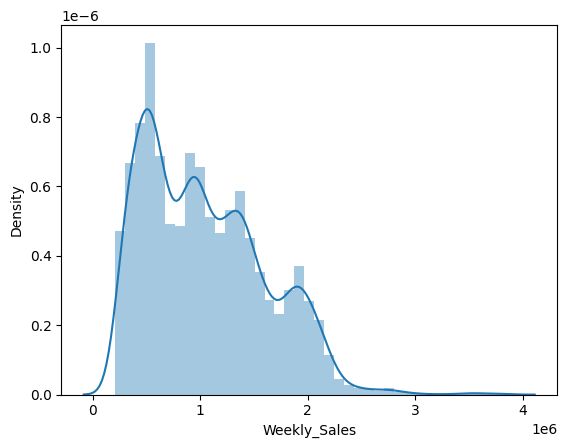

In [110]:
sns.distplot(df['Weekly_Sales'],hist=True)
plt.plot()

 - Weekly sales show a seasonal trend... 

In [111]:
df.Holiday_Flag.value_counts()

0    5985
1     450
Name: Holiday_Flag, dtype: int64

In [112]:
Total_by_store = df.groupby(['Holiday_Flag'],as_index=False).agg({'Weekly_Sales': 'sum'})
Total_by_store 

,Holiday_Flag,Weekly_Sales
0,0,6.231919e+09
1,1,5.052996e+08


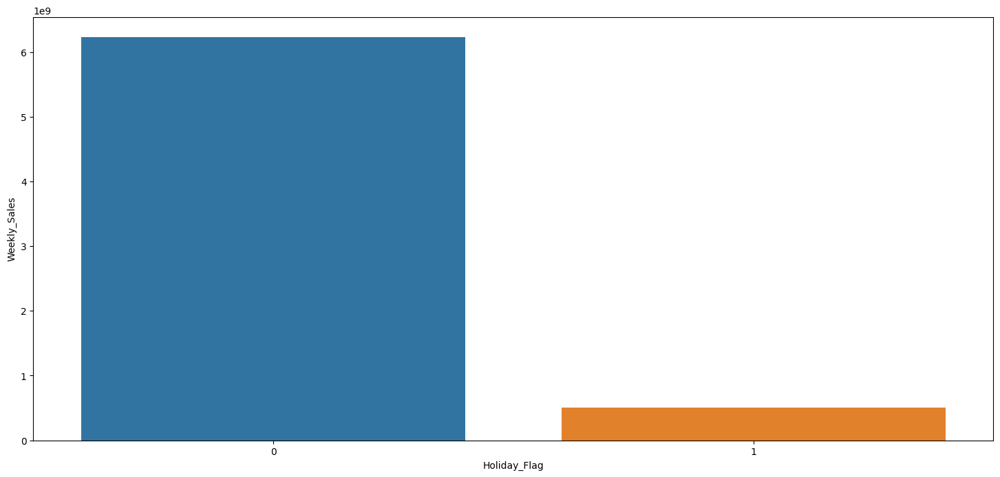

In [114]:
plt.figure(figsize=(18,8))
sns.barplot(x='Holiday_Flag', y='Weekly_Sales', data=Total_by_store)
plt.show()

- Here we can observe that on  Non Holiday Week -Sales is more than the  Holiday Week

In [115]:
Total_by_store = df.groupby(['Store','Holiday_Flag'],as_index=False).agg({'Weekly_Sales': 'sum','Temperature':"mean"})
Total_by_store 

,Store,Holiday_Flag,Weekly_Sales,Temperature
0,1,0,2.057453e+08,69.087669
1,1,1,1.665748e+07,57.921000
2,2,0,2.545898e+08,69.025263
3,2,1,2.079267e+07,57.458000
4,3,0,5.320862e+07,72.076617
...,...,...,...,...
85,43,1,6.359463e+06,58.168000
86,44,0,4.033273e+07,54.503459
87,44,1,2.960356e+06,42.973000
88,45,0,1.040324e+08,58.561729


In [116]:
Total_by_store[Total_by_store["Weekly_Sales"]==Total_by_store["Weekly_Sales"].max()] 

,Store,Holiday_Flag,Weekly_Sales,Temperature
38,20,0,2.789074e+08,56.242256


In [117]:
Total_by_store[Total_by_store["Weekly_Sales"]==Total_by_store["Weekly_Sales"].min()]

,Store,Holiday_Flag,Weekly_Sales,Temperature
65,33,1,2625945.19,67.25


## Observed : In Store 20 Non Holiday Weekday sales is more and temperature is less
## On Holiday Weekday Sales is less and Temperature is More.

### C) Does temperature affect the weekly sales in any manner?

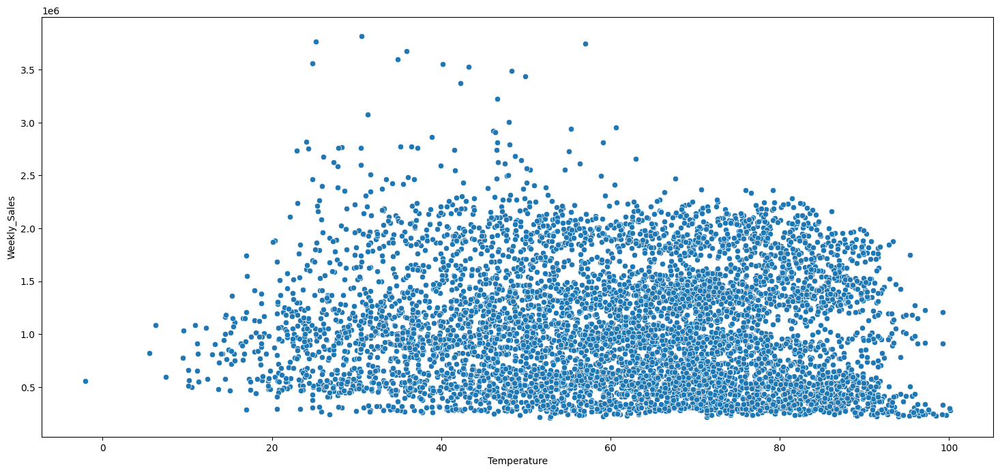

In [120]:
plt.figure(figsize=(18,8))
sns.scatterplot(x='Temperature', y='Weekly_Sales', data=df)
plt.show()

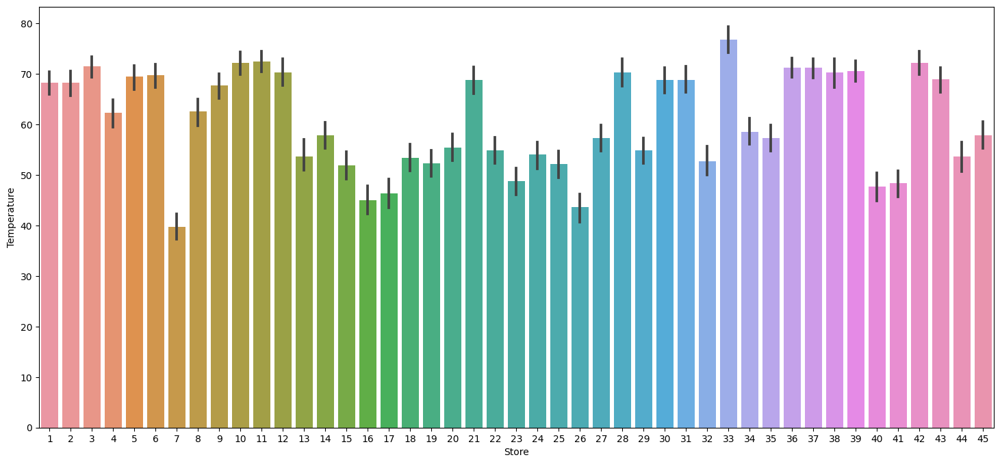

In [122]:
plt.figure(figsize=(18,8))
sns.barplot(x='Store', y='Temperature', data=df)
plt.show()

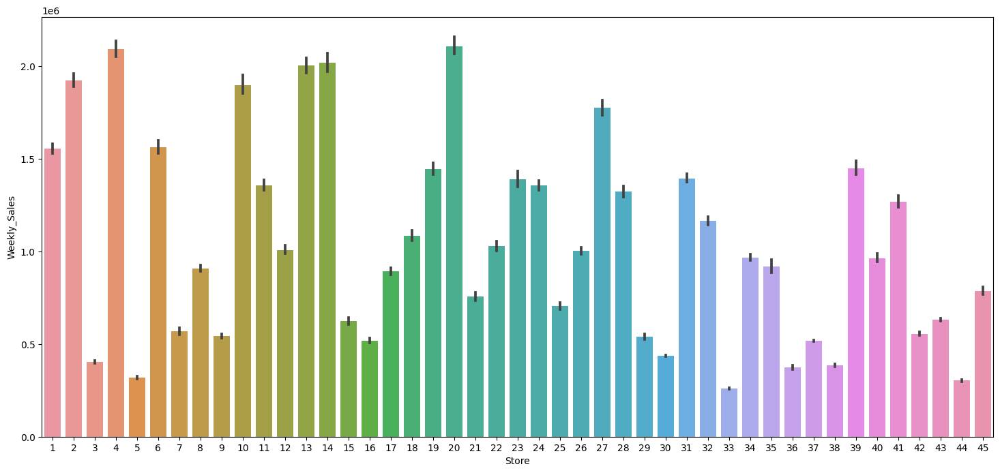

In [123]:
plt.figure(figsize=(18,8))
sns.barplot(x='Store', y='Weekly_Sales', data=df)
plt.show()

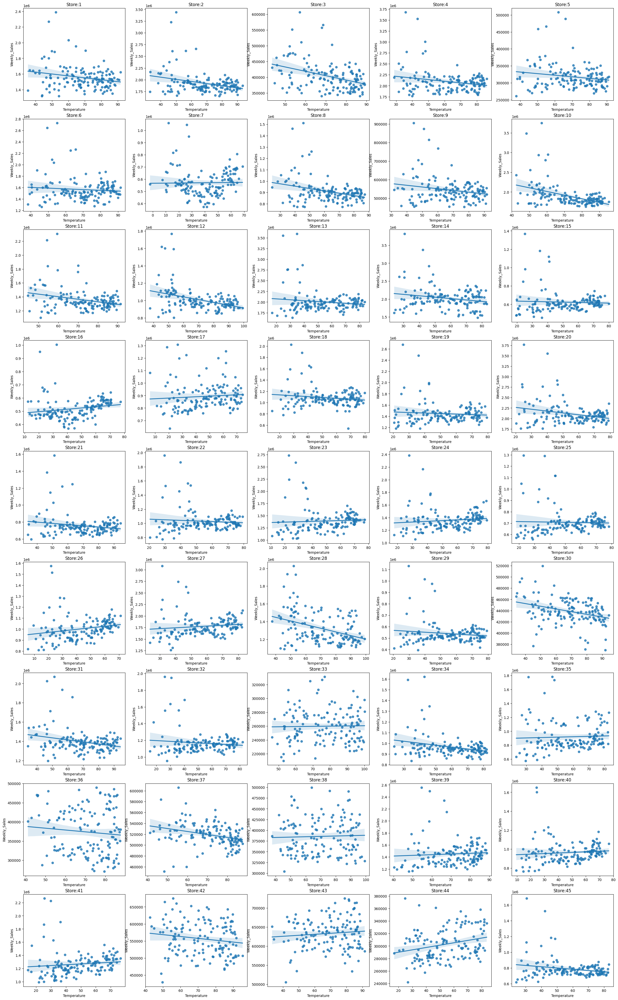

In [124]:
plt.subplots(9,5, figsize=(30,50))
for i in range (1,46):
    plt.subplot(9,5,i)
    sns.regplot(x='Temperature', y='Weekly_Sales', data=df[df['Store']==i])
    plt.title(f'Store:{i}')

In [125]:
Total_by_temp = df.groupby('Temperature',as_index=False).agg({'Weekly_Sales': 'sum'})
Total_by_temp 

,Temperature,Weekly_Sales
0,-2.06,558027.77
1,5.54,817485.14
2,6.23,1083071.14
3,7.46,593875.46
4,9.51,775910.43
...,...,...
3523,99.20,239198.36
3524,99.22,2446625.50
3525,99.66,237095.82
3526,100.07,297753.49


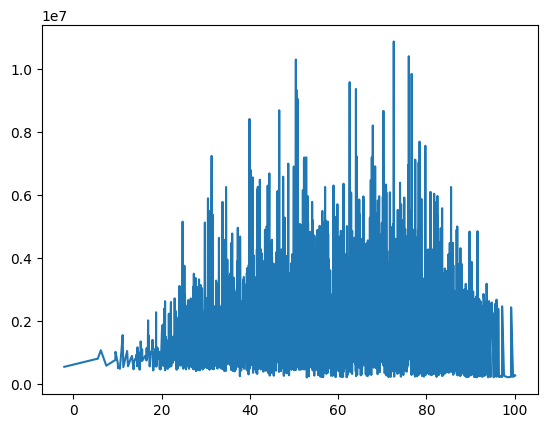

In [126]:
plt.plot(Total_by_temp['Temperature'],Total_by_temp['Weekly_Sales'])
plt.show()

<AxesSubplot: xlabel='Temperature', ylabel='Weekly_Sales'>

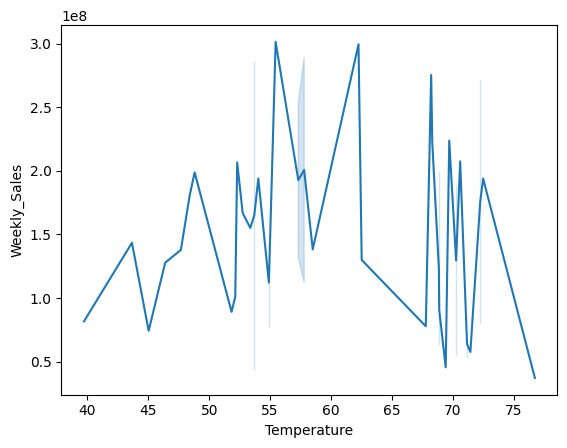

In [127]:
Total_by_store = df.groupby(['Store'], as_index=False).agg({'Weekly_Sales': 'sum', 'Temperature': 'mean'})
sns.lineplot(x='Temperature', y='Weekly_Sales', data=Total_by_store)

# Observed:
- Temperature has affect  
    - we can observe in the above visualization at High Weekly Sales there is lower temperature
    - At Low Weekly Sales at higher temperature

### D) How is the Consumer Price index affecting the weekly sales of various stores?


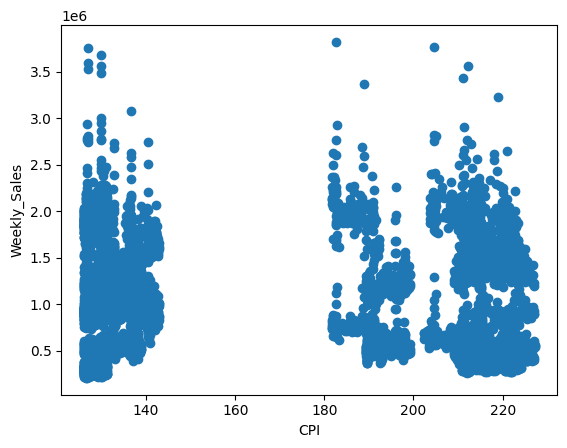

In [128]:
plt.scatter(df["CPI"],df['Weekly_Sales'])
plt.xlabel('CPI')
plt.ylabel("Weekly_Sales")
plt.show()

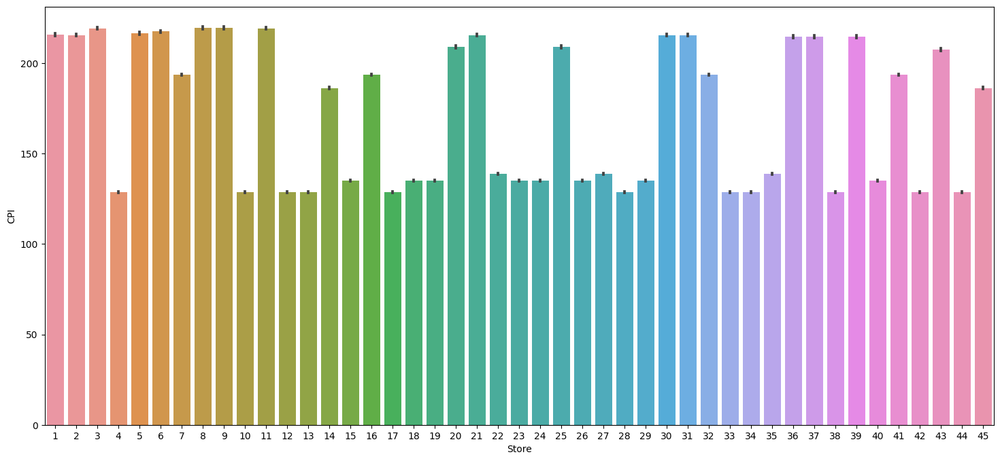

In [130]:
plt.figure(figsize=(18,8))
sns.barplot(x='Store', y='CPI', data=df)
plt.show()

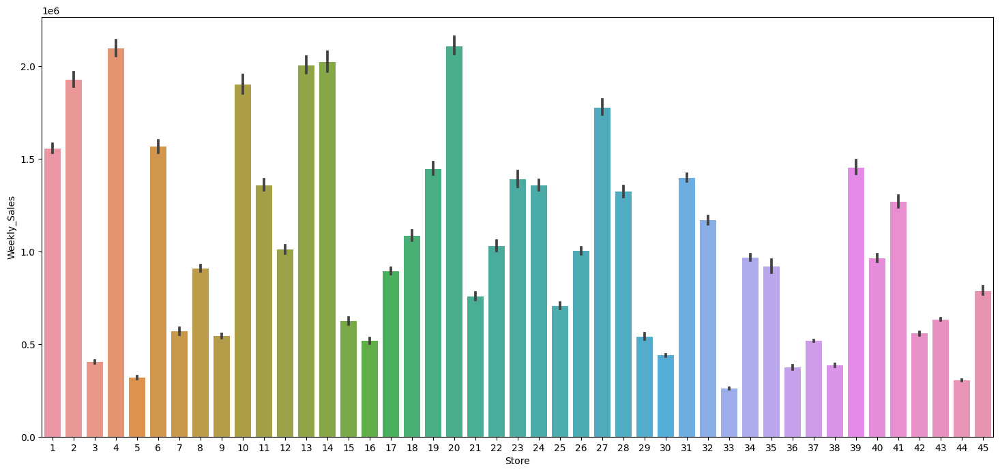

In [131]:
plt.figure(figsize=(18,8))
sns.barplot(x='Store', y='Weekly_Sales', data=df)
plt.show()

In [132]:
Total_by_store = df.groupby('Store').agg({'Weekly_Sales': 'sum', 'CPI': 'sum'})
Total_by_store 

,Weekly_Sales,CPI
Store,,
1,2.224028e+08,30887.555523
2,2.753824e+08,30837.422420
3,5.758674e+07,31372.988971
4,2.995440e+08,18401.192733
5,4.547569e+07,30968.878137
6,2.237561e+08,31110.107182
7,8.159828e+07,27693.986741
8,1.299512e+08,31379.780750
9,7.778922e+07,31406.616557


In [133]:
Total_by_store[Total_by_store.CPI==Total_by_store.CPI.max()]

,Weekly_Sales,CPI
Store,,
9,77789218.99,31406.616557


In [134]:
Total_by_store[Total_by_store.CPI==Total_by_store.CPI.min()]

,Weekly_Sales,CPI
Store,,
4,2.995440e+08,18401.192733
10,2.716177e+08,18401.192733
12,1.442872e+08,18401.192733
13,2.865177e+08,18401.192733
17,1.277821e+08,18401.192733
28,1.892637e+08,18401.192733
33,3.716022e+07,18401.192733
34,1.382498e+08,18401.192733
38,5.515963e+07,18401.192733


# Observed
- Consumer Index(CPI) has affect
    - We can observe in above visualization at High Weekly Sales CPI is low.
    - At Low Weekly Sales CPI is high.

### E) Top performing stores according to the historical data.


In [135]:
Total_data_by_store=df.groupby('Store',as_index=False).agg({"Weekly_Sales":"sum"})
Top_sales_store=Total_data_by_store.sort_values(by='Weekly_Sales',ascending=False)
Top_sales_store

,Store,Weekly_Sales
19,20,3.013978e+08
3,4,2.995440e+08
13,14,2.889999e+08
12,13,2.865177e+08
1,2,2.753824e+08
9,10,2.716177e+08
26,27,2.538559e+08
5,6,2.237561e+08
0,1,2.224028e+08
38,39,2.074455e+08


In [136]:
top_5_stores=Top_sales_store.head()
top_5_stores.reset_index(drop=True)

,Store,Weekly_Sales
0,20,3.013978e+08
1,4,2.995440e+08
2,14,2.889999e+08
3,13,2.865177e+08
4,2,2.753824e+08


- From above result we can observe the top performing stores.

### F) The worst performing store, and how significant is the difference between the highest and lowest performing stores.

In [137]:
Total_data_by_store=df.groupby('Store',as_index=False).agg({"Weekly_Sales":"sum","Temperature":"mean","CPI":"sum","Unemployment":"mean"})
Total_data_by_store

,Store,Weekly_Sales,Temperature,CPI,Unemployment
0,1,2.224028e+08,68.306783,30887.555523,7.610420
1,2,2.753824e+08,68.216364,30837.422420,7.623846
2,3,5.758674e+07,71.434196,31372.988971,7.176986
3,4,2.995440e+08,62.253357,18401.192733,5.964692
4,5,4.547569e+07,69.410140,30968.878137,6.295406
5,6,2.237561e+08,69.700000,31110.107182,6.606902
6,7,8.159828e+07,39.720280,27693.986741,8.585734
7,8,1.299512e+08,62.513986,31379.780750,6.091846
8,9,7.778922e+07,67.775175,31406.616557,6.099881
9,10,2.716177e+08,72.241189,18401.192733,8.362965


In [138]:
Lowest_Store=Total_data_by_store.loc[(Total_data_by_store.Weekly_Sales==Total_data_by_store.Weekly_Sales.min())] 
Lowest_Store

,Store,Weekly_Sales,Temperature,CPI,Unemployment
32,33,37160221.96,76.728182,18401.192733,8.533154


In [139]:
Highest_Store=Total_data_by_store.loc[(Total_data_by_store.Weekly_Sales==Total_data_by_store.Weekly_Sales.max())] 
Highest_Store

,Store,Weekly_Sales,Temperature,CPI,Unemployment
19,20,3.013978e+08,55.451399,29892.45268,7.371413


-- From above analysis Temperatue & Unemployement on lowest store is high that effects the sales

In [140]:
# Extract the 'Weekly_Sales' values for the lowest and highest stores
lowest_sales = Lowest_Store['Weekly_Sales'].values[0]
highest_sales = Highest_Store['Weekly_Sales'].values[0]

# Calculate the difference
difference = highest_sales - lowest_sales

print("Worst Performing Store:", Lowest_Store['Store'].values[0])
print("Best Performing Store:",Highest_Store['Store'].values[0])
print("Difference between the highest and lowest store sales:", difference)


Worst Performing Store: 33
Best Performing Store: 20
Difference between the highest and lowest store sales: 264237570.49999997


In [141]:
#two sample t-test for unequal variances
from scipy.stats import ttest_ind

t_stat_2, p_val_2 = ttest_ind(Highest_Store['Store'].values[0],Lowest_Store['Store'].values[0], equal_var=False)
print(t_stat_2, p_val_2)

nan nan


C:\Users\praty\AppData\Local\Temp\ipykernel_28972\3270785390.py:4: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  t_stat_2, p_val_2 = ttest_ind(Highest_Store['Store'].values[0],Lowest_Store['Store'].values[0], equal_var=False)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\scipy\stats\_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\scipy\stats\_stats_py.py:1214: RuntimeWarning: invalid value encountered in scalar multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero


In [143]:
df.dtypes

Store             int64
Date             object
Weekly_Sales    float64
Holiday_Flag      int64
Temperature     float64
Fuel_Price      float64
CPI             float64
Unemployment    float64
dtype: object

##### **Converting Date data_type(object ) to datetime(datetime64) data_types**

In [144]:
df.Date=pd.to_datetime(df.Date,format="%d-%m-%Y")

In [145]:
df.Date.dtypes

dtype('<M8[ns]')

In [146]:
df=df.set_index("Date")

In [147]:
df

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
Date,,,,,,,
2010-02-05,1,1643690.90,0,42.31,2.572,211.096358,8.106
2010-02-12,1,1641957.44,1,38.51,2.548,211.242170,8.106
2010-02-19,1,1611968.17,0,39.93,2.514,211.289143,8.106
2010-02-26,1,1409727.59,0,46.63,2.561,211.319643,8.106
2010-03-05,1,1554806.68,0,46.50,2.625,211.350143,8.106
...,...,...,...,...,...,...,...
2012-09-28,45,713173.95,0,64.88,3.997,192.013558,8.684
2012-10-05,45,733455.07,0,64.89,3.985,192.170412,8.667
2012-10-12,45,734464.36,0,54.47,4.000,192.327265,8.667


In [148]:
df.shape

(6435, 7)

# Time Series Analysis

In [149]:
df_target=df.loc[:,['Store',"Weekly_Sales"]]

In [150]:
df_target

,Store,Weekly_Sales
Date,,
2010-02-05,1,1643690.90
2010-02-12,1,1641957.44
2010-02-19,1,1611968.17
2010-02-26,1,1409727.59
2010-03-05,1,1554806.68
...,...,...
2012-09-28,45,713173.95
2012-10-05,45,733455.07
2012-10-12,45,734464.36


In [151]:
df_target.dtypes

Store             int64
Weekly_Sales    float64
dtype: object

In [152]:
from pmdarima import auto_arima
model = auto_arima(df["Weekly_Sales"], seasonal=True, stepwise=True, trace=True)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=173103.554, Time=1.43 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=174457.419, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=173626.224, Time=0.27 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=173359.721, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=174455.423, Time=0.07 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=173301.748, Time=0.96 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=173266.524, Time=1.12 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=172741.309, Time=1.81 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=172905.020, Time=1.56 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=172730.428, Time=4.30 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=172847.176, Time=1.32 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=172588.751, Time=7.38 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=172597.113, Time=2.01 sec
 ARIMA(5,1,3)(0,0,0)[0] intercept   : AIC=172572.018, Time=4.29 sec
 ARIM

### Store_1 Dataset

In [153]:
result=adfuller(df_target[df_target['Store']==1]['Weekly_Sales']) 
result

(-5.102186145192285,
 1.3877788330759535e-05,
 4,
 138,
 {'1%': -3.47864788917503,
  '5%': -2.882721765644168,
  '10%': -2.578065326612056},
 3412.7325502876756)

#### From the above, we see that that p value is close to 0 and we can conclude that the data is stationary


In [154]:
p_value=result[1]
p_value
if p_value <=0.05:
    print('Stationarity is present')
else:
    print('NO Stationarity is present')

Stationarity is present


In [155]:
store1=pd.DataFrame(df_target[df_target['Store']==1]['Weekly_Sales'])
store1=store1.sort_index()
store1

,Weekly_Sales
Date,
2010-02-05,1643690.90
2010-02-12,1641957.44
2010-02-19,1611968.17
2010-02-26,1409727.59
2010-03-05,1554806.68
...,...
2012-09-28,1437059.26
2012-10-05,1670785.97
2012-10-12,1573072.81


#### Visualizing Seasonality 

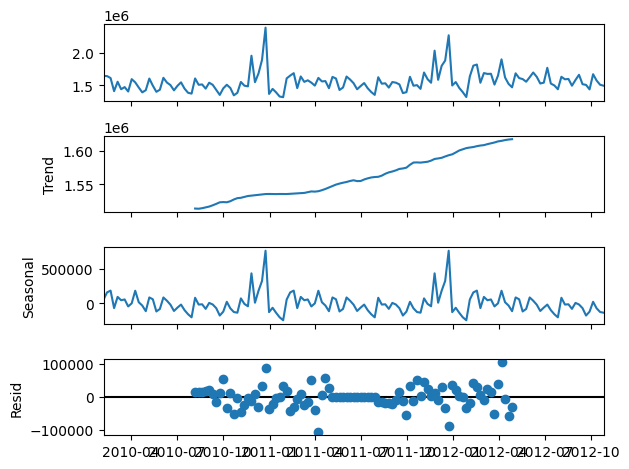

In [156]:
decompose=seasonal_decompose(store1.dropna())
decompose_plot=decompose.plot()

In [157]:
acf_plot=acf(store1["Weekly_Sales"])

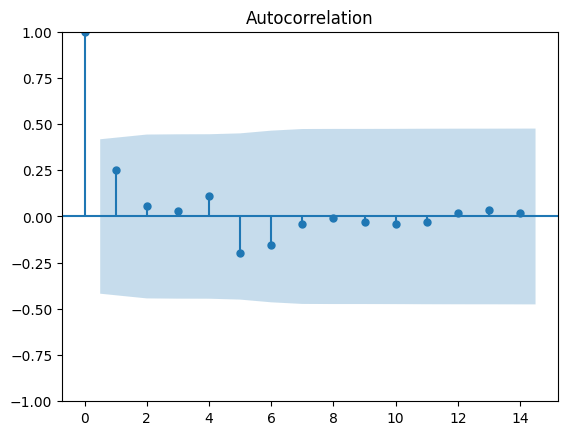

In [158]:
plot_acf(acf_plot)
plt.show()

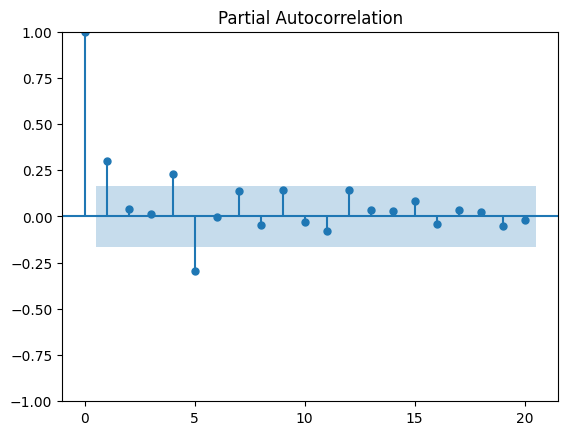

In [159]:
plot_pacf(store1["Weekly_Sales"],lags=20)
plt.show()

In [160]:
store1['lag1']=store1['Weekly_Sales'].diff()

In [161]:
store1['lag52']=store1['Weekly_Sales'].diff(52)

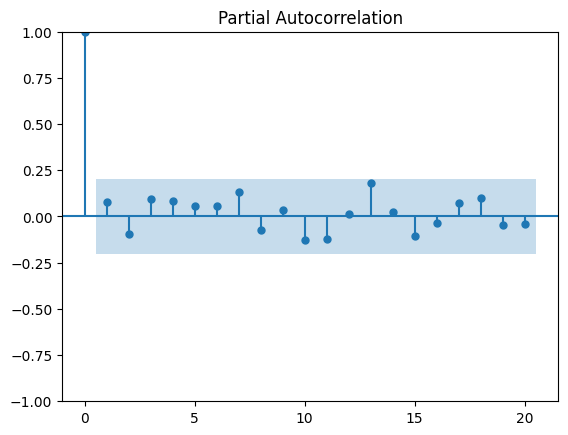

In [162]:
pacf_values=plot_pacf(store1['lag52'].dropna(),lags=20)

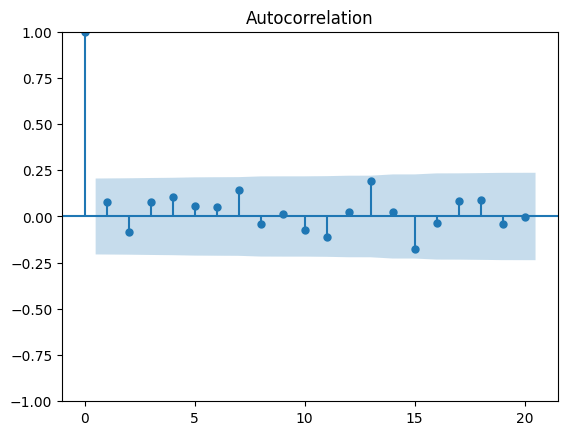

In [163]:
acf_values=plot_acf(store1['lag52'].dropna(),lags=20)

In [164]:
# From the above, pacf(p) ,acf(q) value is 0
pacf_values=sm.tsa.pacf(store1['Weekly_Sales'],nlags=20)
pacf_values

array([ 1.        ,  0.30375985,  0.04021628,  0.01219543,  0.23927843,
       -0.30788835, -0.0014493 ,  0.14798536, -0.05206473,  0.1547872 ,
       -0.03652748, -0.08797706,  0.16184013,  0.03250986,  0.03380417,
        0.10062548, -0.04966531,  0.04265725,  0.02866535, -0.0672978 ,
       -0.0144685 ])

- p[1]=0.30 value will be near to zero then p=0 

In [165]:
train = store1.iloc[:116]['Weekly_Sales']
test = store1.iloc[117:]['Weekly_Sales']
 

#### Training the Model

In [166]:
model=SARIMAX(train,order=(0,1,0),seasonal_order=(0,1,0,52))
model_fit = model.fit()
model_fit.summary()

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                       Weekly_Sales   No. Observations:                  116
Model:             SARIMAX(0, 1, 0)x(0, 1, 0, 52)   Log Likelihood                -814.081
Date:                            Mon, 01 Jan 2024   AIC                           1630.161
Time:                                    22:47:36   BIC                           1632.305
Sample:                                02-05-2010   HQIC                          1631.004
                                     - 04-20-2012                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      4.227e+09   3.26e+08     12.964      0.000    3.59e+09    4.87e+09
===================================================================================
Ljung-Box (L1) (Q):                   7.14   Jarque-Bera (JB):                 2.40
Prob(Q):                              0.01   Prob(JB):                         0.30
Heteroskedasticity (H):               1.86   Skew:                             0.09
Prob(H) (two-sided):                  0.16   Kurtosis:                         3.94
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

### Testing the Model

In [167]:
pred = model_fit.predict(start= len(train),end=len(train)+len(test)- 1,dynamic=True)
 

In [168]:
pred
 

2012-04-27    1411848.75
2012-05-04    1586149.34
2012-05-11    1561533.64
2012-05-18    1384976.33
2012-05-25    1422804.73
2012-06-01    1591836.47
2012-06-08    1545706.38
2012-06-15    1488872.92
2012-06-22    1395588.21
2012-06-29    1445296.15
2012-07-06    1491607.70
2012-07-13    1411878.03
2012-07-20    1353684.88
2012-07-27    1308977.85
2012-08-03    1581141.81
2012-08-10    1481905.15
2012-08-17    1487519.49
2012-08-24    1421451.52
2012-08-31    1506987.28
2012-09-07    1497229.30
2012-09-14    1471017.84
2012-09-21    1336778.33
2012-09-28    1351319.89
2012-10-05    1587748.01
2012-10-12    1450283.99
2012-10-19    1459320.84
Freq: W-FRI, Name: predicted_mean, dtype: float64

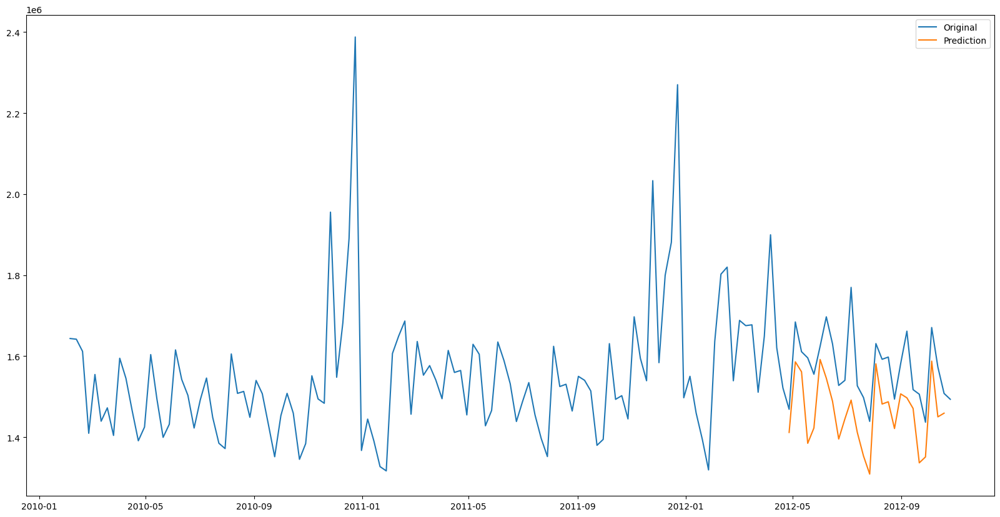

In [169]:
plt.figure(figsize=(20,10))
plt.plot(store1['Weekly_Sales'],label="Original")
plt.plot(pred,label="Prediction")
plt.legend()
plt.show()

#### Forecasting for Next 12 Weekly_Sales

In [170]:
forecast=model_fit.forecast(steps=12)

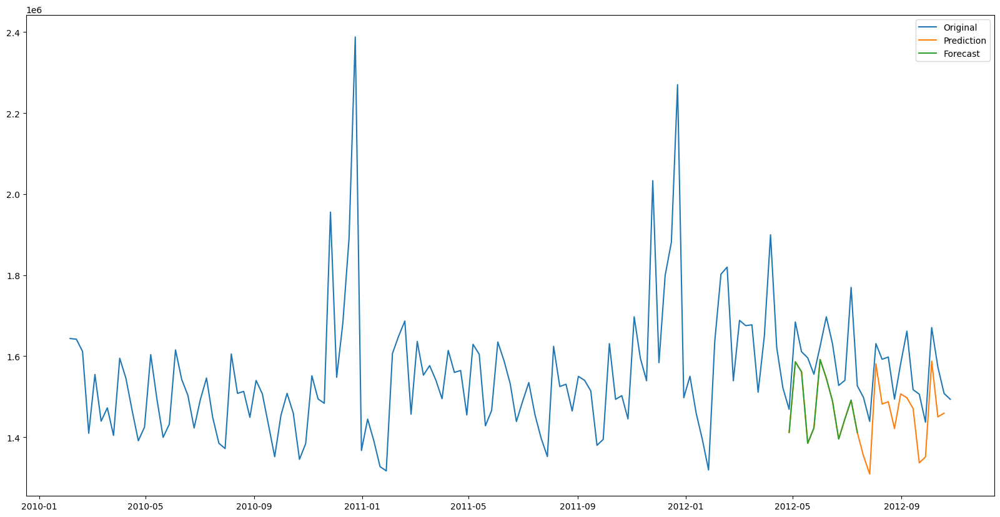

In [171]:
plt.figure(figsize=(20,10))
plt.plot(store1['Weekly_Sales'],label="Original")
plt.plot(pred,label="Prediction")
plt.plot(forecast,label="Forecast")
plt.legend()
plt.show()

In [172]:
# Assuming 'test' contains the actual values from your test dataset
comparison = pd.DataFrame({'Actual': test, 'Predicted': pred})
comparison.dropna(inplace=True)


In [173]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

mae = mean_absolute_error(comparison['Actual'], comparison['Predicted'])
mse = mean_squared_error(comparison['Actual'], comparison['Predicted'])
rmse = np.sqrt(mse)
print(f'Mean Absolute Error (MAE): {mae}')
print(f'Mean Squared Error (MSE): {mse}')
print(f'Root Mean Squared Error (RMSE): {rmse}')


Mean Absolute Error (MAE): 114072.18199999996
Mean Squared Error (MSE): 16028529961.942461
Root Mean Squared Error (RMSE): 126603.83075540196


In [174]:
### Store_2 Dataset

In [175]:
result=adfuller(df_target[df_target['Store']==2]['Weekly_Sales']) 
result

(-3.7088625726189153,
 0.003990207089066268,
 6,
 136,
 {'1%': -3.4793722137854926,
  '5%': -2.8830370378332995,
  '10%': -2.578233635380623},
 3512.243755386891)

In [176]:
#### From the above, we see that that p value is close to 0 and we can conclude that the data is stationary


In [177]:
p_value=result[1]
p_value
if p_value <=0.05:
    print('Stationarity is present')
else:
    print('NO Stationarity is present')

Stationarity is present


In [178]:
store2=pd.DataFrame(df_target[df_target['Store']==2]['Weekly_Sales'])
store2=store2.sort_index()
store2

,Weekly_Sales
Date,
2010-02-05,2136989.46
2010-02-12,2137809.50
2010-02-19,2124451.54
2010-02-26,1865097.27
2010-03-05,1991013.13
...,...
2012-09-28,1746470.56
2012-10-05,1998321.04
2012-10-12,1900745.13


#### Visualizing Seasonality 

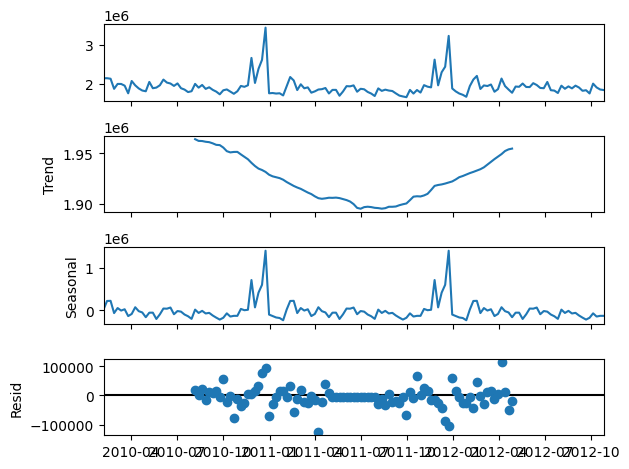

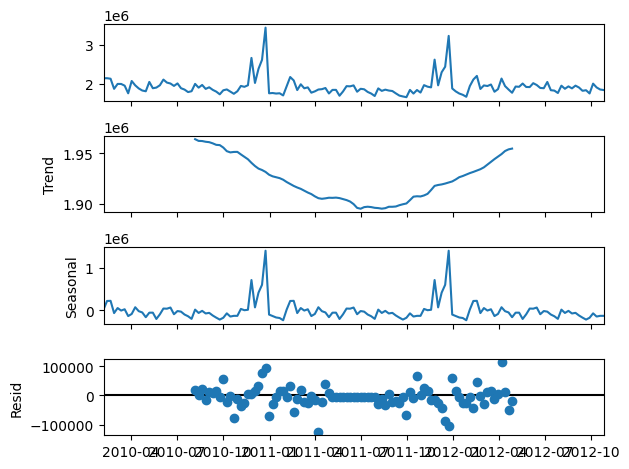

In [179]:
decompose=seasonal_decompose(store2.dropna())
decompose.plot()

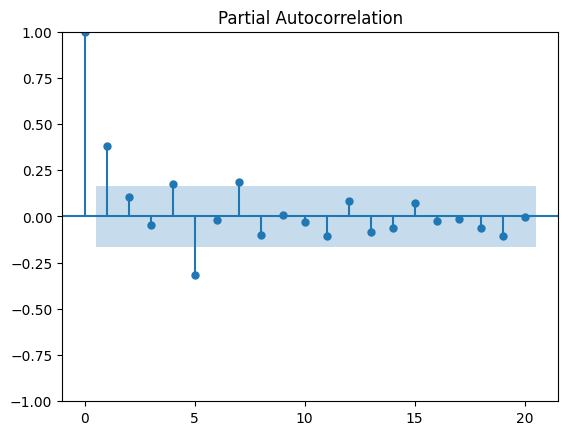

In [180]:
plot_pacf(store2["Weekly_Sales"],lags=20)
plt.show()

In [181]:
store2['lag1']=store1['Weekly_Sales'].diff()
store2['lag52']=store1['Weekly_Sales'].diff(52)

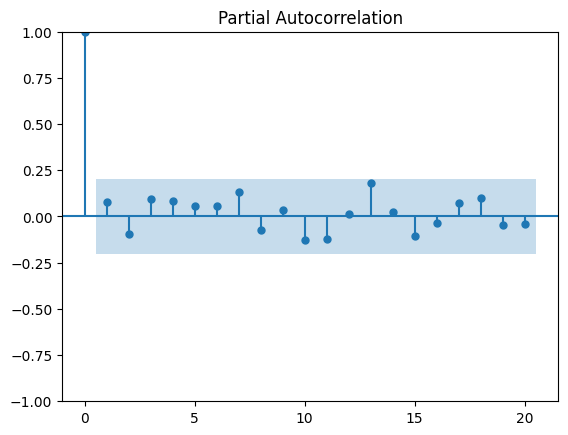

In [182]:
pacf_values=plot_pacf(store1['lag52'].dropna(),lags=20)

In [183]:
pacf_values=sm.tsa.pacf(store2['Weekly_Sales'],nlags=20)
pacf_values

array([ 1.        ,  0.38587372,  0.10823551, -0.04658177,  0.17916511,
       -0.33086122, -0.0192553 ,  0.20004553, -0.10931221,  0.01105632,
       -0.03023624, -0.11649167,  0.09603219, -0.0947752 , -0.07070914,
        0.09128467, -0.03215824, -0.01709414, -0.07026318, -0.12648523,
        0.00434761])

- p[1]=0.38 value will be near to zero then p=0 

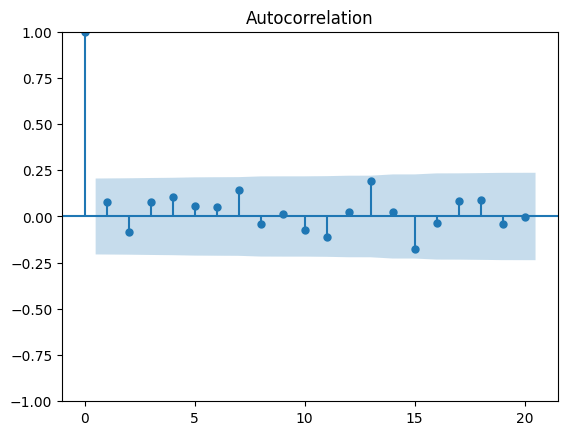

In [184]:
# From the above, pacf(p) ,acf(q) value is 0

acf_values=plot_acf(store2['lag52'].dropna(),lags=20)

In [185]:
 
train = store2.iloc[:round(len(store2)*0.7)]['Weekly_Sales']
 

#### Training the Model

In [186]:
model=SARIMAX(train,order=(0,1,0),seasonal_order=(0,1,0,52))
model_fit = model.fit()
model_fit.summary()

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                       Weekly_Sales   No. Observations:                  100
Model:             SARIMAX(0, 1, 0)x(0, 1, 0, 52)   Log Likelihood                -620.580
Date:                            Mon, 01 Jan 2024   AIC                           1243.161
Time:                                    22:47:48   BIC                           1245.011
Sample:                                02-05-2010   HQIC                          1243.857
                                     - 12-30-2011                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      5.578e+09   4.13e+08     13.503      0.000    4.77e+09    6.39e+09
===================================================================================
Ljung-Box (L1) (Q):                   6.61   Jarque-Bera (JB):                 3.07
Prob(Q):                              0.01   Prob(JB):                         0.22
Heteroskedasticity (H):               0.73   Skew:                             0.32
Prob(H) (two-sided):                  0.53   Kurtosis:                         4.07
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

#### Testing the Model

In [187]:
pred = model_fit.predict(start= len(train),end=len(store2)- 1,dynamic=True)
 

In [188]:
pred

2012-01-06    1881842.76
2012-01-13    1867985.55
2012-01-20    1875176.87
2012-01-27    1819163.65
2012-02-03    2053138.20
2012-02-10    2291833.58
2012-02-17    2204676.79
2012-02-24    1957303.05
2012-03-02    2105399.75
2012-03-09    2002899.28
2012-03-16    2026349.63
2012-03-23    1889954.02
2012-03-30    1923963.33
2012-04-06    1971344.58
2012-04-13    1980259.81
2012-04-20    2010131.57
2012-04-27    1869337.25
2012-05-04    1961535.57
2012-05-11    1962305.04
2012-05-18    1812073.83
2012-05-25    1921524.53
2012-06-01    2057548.18
2012-06-08    2052945.13
2012-06-15    2077563.96
2012-06-22    1914717.77
2012-06-29    1990034.97
2012-07-06    1976953.96
2012-07-13    1908979.26
2012-07-20    1867608.38
2012-07-27    1804485.03
2012-08-03    2000496.23
2012-08-10    1936560.23
2012-08-17    1967886.56
2012-08-24    1944931.88
2012-08-31    1932911.67
2012-09-07    1871792.62
2012-09-14    1815231.49
2012-09-21    1793091.75
2012-09-28    1774186.41
2012-10-05    1961345.40


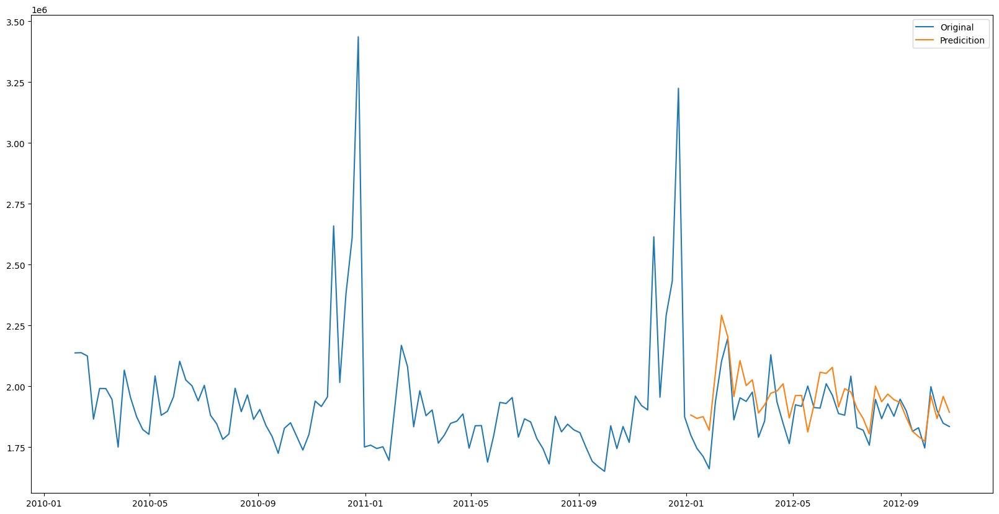

In [189]:
plt.figure(figsize=(20,10))
plt.plot(store2['Weekly_Sales'],label="Original")
plt.plot(pred,label="Predicition")
plt.legend(loc="best")
plt.show()

#### Forecasting for Next 12 Weekly_Sales

In [190]:
forecast=model_fit.forecast(steps=12)

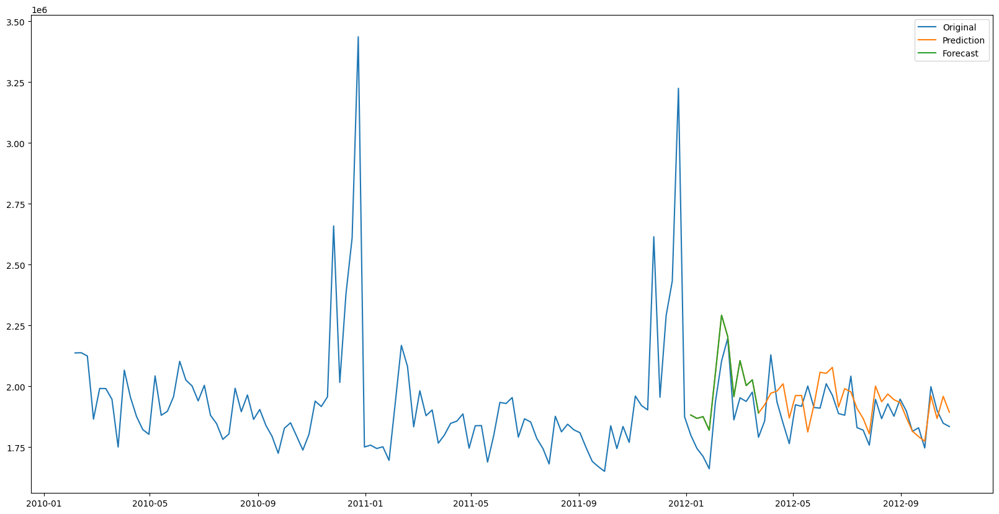

In [191]:
plt.figure(figsize=(20,10)) 
plt.plot(store2['Weekly_Sales'],label="Original")
plt.plot(pred,label="Prediction")
plt.plot(forecast,label="Forecast")
plt.legend()
plt.show()

In [192]:
### Store_3 Dataset

In [193]:
result=adfuller(df_target[df_target["Store"]==3]['Weekly_Sales'])
result

(-2.9638677455113234,
 0.03840926179831252,
 6,
 136,
 {'1%': -3.4793722137854926,
  '5%': -2.8830370378332995,
  '10%': -2.578233635380623},
 3064.8688740270823)

In [194]:
#### From the above, we see that that p value is close to 0 and we can conclude that the data is stationary


In [195]:
if(result[1]<0.05):
    print("Stationary is present")
else:
    print("Not Stationary is present")

Stationary is present


In [196]:
store3=pd.DataFrame(df_target[df_target["Store"]==3]["Weekly_Sales"])
store3

,Weekly_Sales
Date,
2010-02-05,461622.22
2010-02-12,420728.96
2010-02-19,421642.19
2010-02-26,407204.86
2010-03-05,415202.04
...,...
2012-09-28,389813.02
2012-10-05,443557.65
2012-10-12,410804.39


#### Visualizing Seasonality 

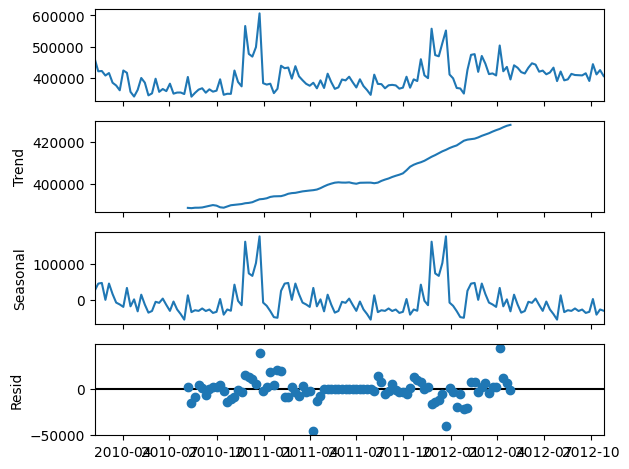

In [197]:
decompose=seasonal_decompose(store3.dropna())
decompose_plot=decompose.plot()

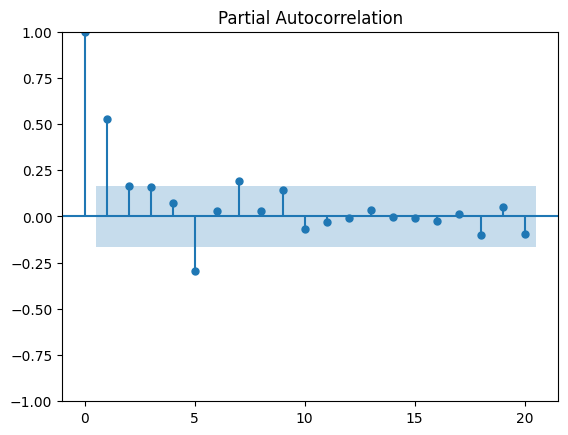

In [198]:
plot_pacf=plot_pacf(store3,lags=20)

In [199]:
pacf_values=sm.tsa.pacf(store3)
pacf_values

array([ 1.        ,  0.53042557,  0.16668644,  0.16412365,  0.07607959,
       -0.30861064,  0.03206715,  0.20732115,  0.03058033,  0.15655645,
       -0.07733061, -0.03305565, -0.00670322,  0.04113646, -0.00272844,
       -0.01149093, -0.02874185,  0.01255839, -0.12058603,  0.05944455,
       -0.10975721, -0.10468814])

- p[1]=0.53 value will be near to zero then p=0 

In [200]:
store3['lag1']=store3['Weekly_Sales'].diff()
store3['lag52']=store3['Weekly_Sales'].diff(52)

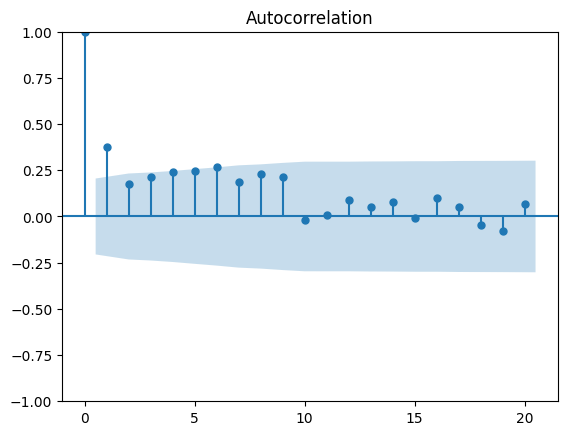

In [201]:
# From the above, pacf(p) ,acf(q) value is 0

acf_values = plot_acf(store3['lag52'].dropna(), lags=20)


In [202]:
 
train = store3.iloc[:round(len(store2)*0.7)]['Weekly_Sales']
 

#### Training the Model

In [203]:
model=SARIMAX(train,order=(0,1,0),seasonal_order=(0,1,0,52))
model_fit=model.fit()
model_fit.summary()

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                       Weekly_Sales   No. Observations:                  100
Model:             SARIMAX(0, 1, 0)x(0, 1, 0, 52)   Log Likelihood                -550.102
Date:                            Mon, 01 Jan 2024   AIC                           1102.205
Time:                                    22:48:00   BIC                           1104.055
Sample:                                02-05-2010   HQIC                          1102.901
                                     - 12-30-2011                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      5.882e+08   7.07e+07      8.320      0.000     4.5e+08    7.27e+08
===================================================================================
Ljung-Box (L1) (Q):                   5.22   Jarque-Bera (JB):                 2.07
Prob(Q):                              0.02   Prob(JB):                         0.35
Heteroskedasticity (H):               1.01   Skew:                             0.07
Prob(H) (two-sided):                  0.98   Kurtosis:                         4.02
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

#### Testing the Model

In [204]:
pred=model_fit.predict(start=len(train),end=len(store3)-1,dynamic=True)
 
pred

2012-01-06    406117.46
2012-01-13    408937.22
2012-01-20    378752.82
2012-01-27    392742.36
2012-02-03    466392.65
2012-02-10    458402.33
2012-02-17    460658.22
2012-02-24    425087.31
2012-03-02    464960.63
2012-03-09    432629.42
2012-03-16    419985.63
2012-03-23    408559.79
2012-03-30    402432.20
2012-04-06    411951.43
2012-04-13    394126.81
2012-04-20    419736.16
2012-04-27    395281.52
2012-05-04    440918.24
2012-05-11    414188.80
2012-05-18    392479.25
2012-05-25    397226.72
2012-06-01    422383.96
2012-06-08    419514.87
2012-06-15    431299.46
2012-06-22    413396.83
2012-06-29    396838.84
2012-07-06    423022.36
2012-07-13    401330.45
2012-07-20    388493.49
2012-07-27    373257.41
2012-08-03    437857.37
2012-08-10    408252.97
2012-08-17    407593.03
2012-08-24    394243.67
2012-08-31    403864.81
2012-09-07    405223.61
2012-09-14    403505.63
2012-09-21    393125.06
2012-09-28    396354.05
2012-10-05    431218.52
2012-10-12    396158.69
2012-10-19    42

[]

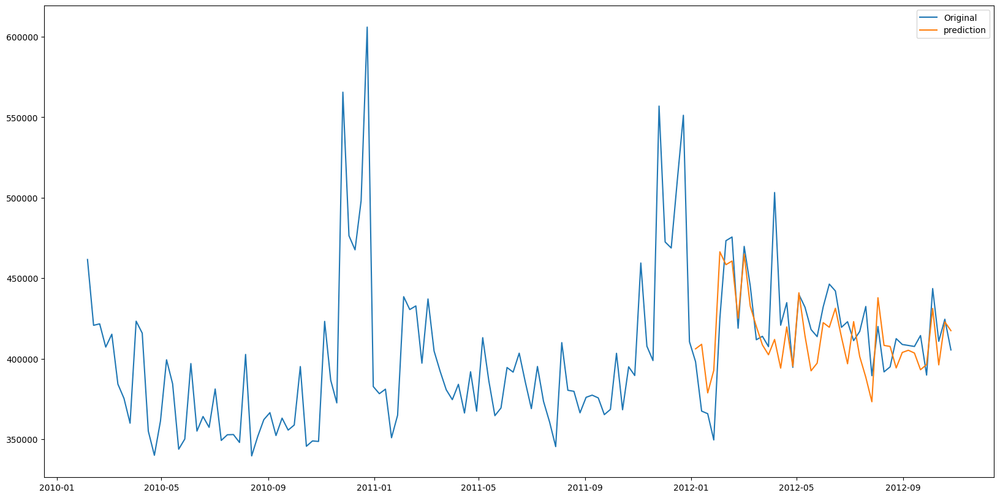

In [205]:
plt.figure(figsize=(20,10))
plt.plot(store3['Weekly_Sales'],label="Original")
plt.plot(pred,label="prediction")
plt.legend()
plt.plot()

#### Forecasting for Next 12 Weekly_Sales

In [206]:
forecast=model_fit.forecast(steps=12)

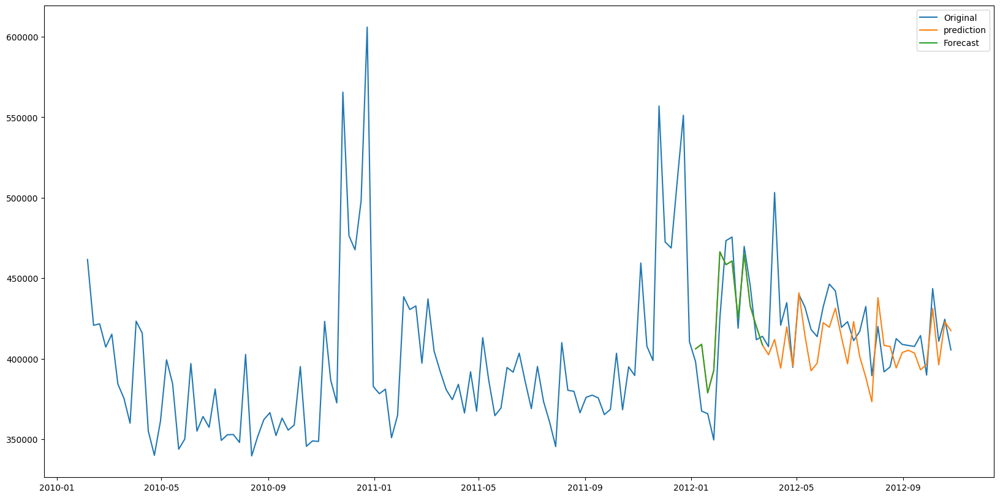

In [207]:
plt.figure(figsize=(20,10))
plt.plot(store3['Weekly_Sales'],label="Original")
plt.plot(pred,label="prediction")
plt.plot(forecast,label="Forecast")
plt.legend()
plt.show()

In [208]:
### Store_4 Dataset

In [209]:
result=adfuller(df_target[df_target["Store"]==3]['Weekly_Sales'])
result

(-2.9638677455113234,
 0.03840926179831252,
 6,
 136,
 {'1%': -3.4793722137854926,
  '5%': -2.8830370378332995,
  '10%': -2.578233635380623},
 3064.8688740270823)

In [210]:
#### From the above, we see that that p value is close to 0 and we can conclude that the data is stationary


In [211]:
if(result[1]<0.05):
    print("Stationary is present")
else:
    print("Not Stationary is present")

Stationary is present


In [212]:
store4=pd.DataFrame(df_target[df_target["Store"]==4]["Weekly_Sales"])
store4

,Weekly_Sales
Date,
2010-02-05,2135143.87
2010-02-12,2188307.39
2010-02-19,2049860.26
2010-02-26,1925728.84
2010-03-05,1971057.44
...,...
2012-09-28,2027620.23
2012-10-05,2209835.43
2012-10-12,2133026.07


#### Visualizing Seasonality 

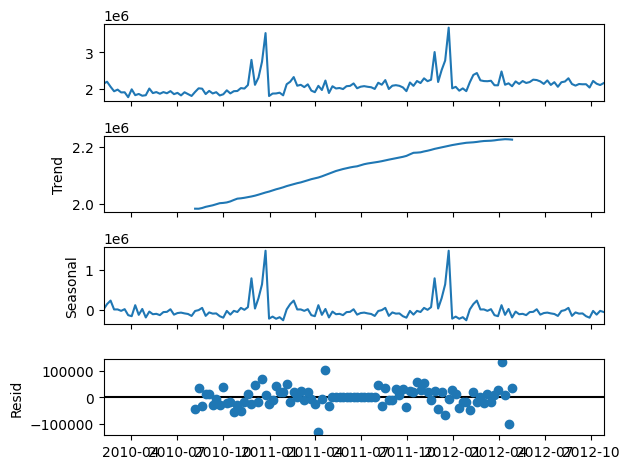

In [213]:
decompose=seasonal_decompose(store4.dropna())
decompose_plot=decompose.plot()

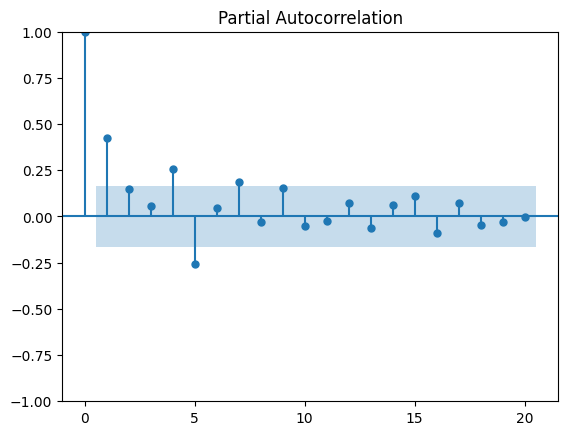

In [214]:
from statsmodels.graphics.tsaplots import plot_pacf  # Import the plot_pacf function
store4["lag1"] = store4["Weekly_Sales"].diff()
store4["lag52"] = store4["Weekly_Sales"].diff(52)

# Assign the result to a different variable, e.g., pacf_values
pacf_values = plot_pacf(store4["Weekly_Sales"].dropna(), lags=20)


In [215]:
import statsmodels.api as sm
pacf_values = sm.tsa.pacf(store4['Weekly_Sales'])
pacf_values

array([ 1.        ,  0.42660057,  0.14997967,  0.05755091,  0.26798839,
       -0.26983153,  0.04846441,  0.19886998, -0.03604879,  0.17085998,
       -0.05515318, -0.02977369,  0.08230812, -0.07078321,  0.07406462,
        0.12552134, -0.10985915,  0.0946333 , -0.05996523, -0.03564473,
        0.0082363 , -0.104122  ])

- p[1]=0.426 value will be near to zero then p=0 

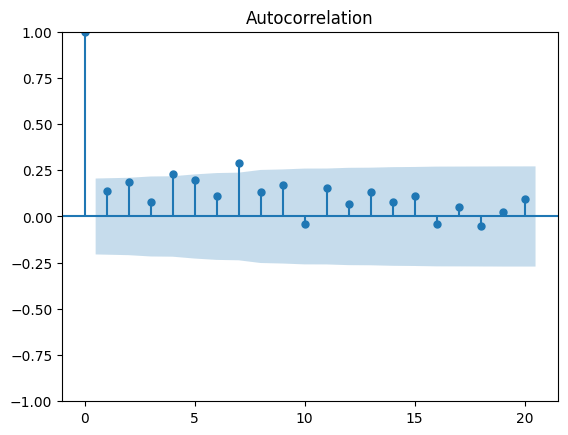

In [216]:
# From the above, pacf(p) ,acf(q) value is 0

acf_values = plot_acf(store4['lag52'].dropna(), lags=20)


In [217]:
 
train = store4.iloc[:round(len(store4)*0.7)]['Weekly_Sales']
 

#### Training the Model

In [218]:
model=SARIMAX(train,order=(0,1,0),seasonal_order=(0,1,0,52))
model.fit=model.fit()
model_fit.summary()

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                       Weekly_Sales   No. Observations:                  100
Model:             SARIMAX(0, 1, 0)x(0, 1, 0, 52)   Log Likelihood                -550.102
Date:                            Mon, 01 Jan 2024   AIC                           1102.205
Time:                                    22:48:12   BIC                           1104.055
Sample:                                02-05-2010   HQIC                          1102.901
                                     - 12-30-2011                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      5.882e+08   7.07e+07      8.320      0.000     4.5e+08    7.27e+08
===================================================================================
Ljung-Box (L1) (Q):                   5.22   Jarque-Bera (JB):                 2.07
Prob(Q):                              0.02   Prob(JB):                         0.35
Heteroskedasticity (H):               1.01   Skew:                             0.07
Prob(H) (two-sided):                  0.98   Kurtosis:                         4.02
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

#### Testing the Model

In [219]:
pred=model_fit.predict(start=len(train),end=len(store4)-1,dynamic=True)
 
pred

2012-01-06    406117.46
2012-01-13    408937.22
2012-01-20    378752.82
2012-01-27    392742.36
2012-02-03    466392.65
2012-02-10    458402.33
2012-02-17    460658.22
2012-02-24    425087.31
2012-03-02    464960.63
2012-03-09    432629.42
2012-03-16    419985.63
2012-03-23    408559.79
2012-03-30    402432.20
2012-04-06    411951.43
2012-04-13    394126.81
2012-04-20    419736.16
2012-04-27    395281.52
2012-05-04    440918.24
2012-05-11    414188.80
2012-05-18    392479.25
2012-05-25    397226.72
2012-06-01    422383.96
2012-06-08    419514.87
2012-06-15    431299.46
2012-06-22    413396.83
2012-06-29    396838.84
2012-07-06    423022.36
2012-07-13    401330.45
2012-07-20    388493.49
2012-07-27    373257.41
2012-08-03    437857.37
2012-08-10    408252.97
2012-08-17    407593.03
2012-08-24    394243.67
2012-08-31    403864.81
2012-09-07    405223.61
2012-09-14    403505.63
2012-09-21    393125.06
2012-09-28    396354.05
2012-10-05    431218.52
2012-10-12    396158.69
2012-10-19    42

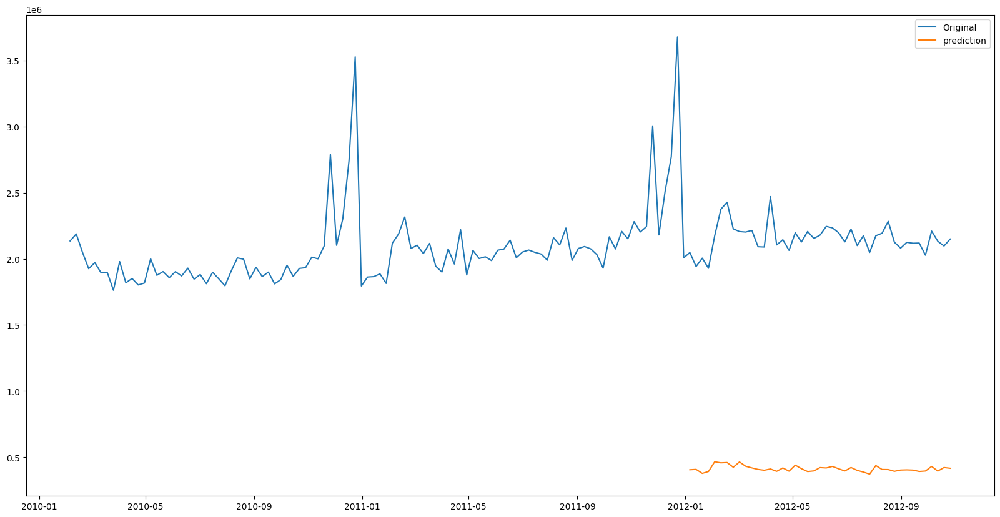

In [220]:
plt.figure(figsize=(20,10))
plt.plot(store4['Weekly_Sales'],label="Original")
plt.plot(pred,label="prediction")
plt.legend()
plt.show()

#### Forecasting for Next 12 Weekly_Sales

In [221]:
forecast=model_fit.forecast(steps=12)

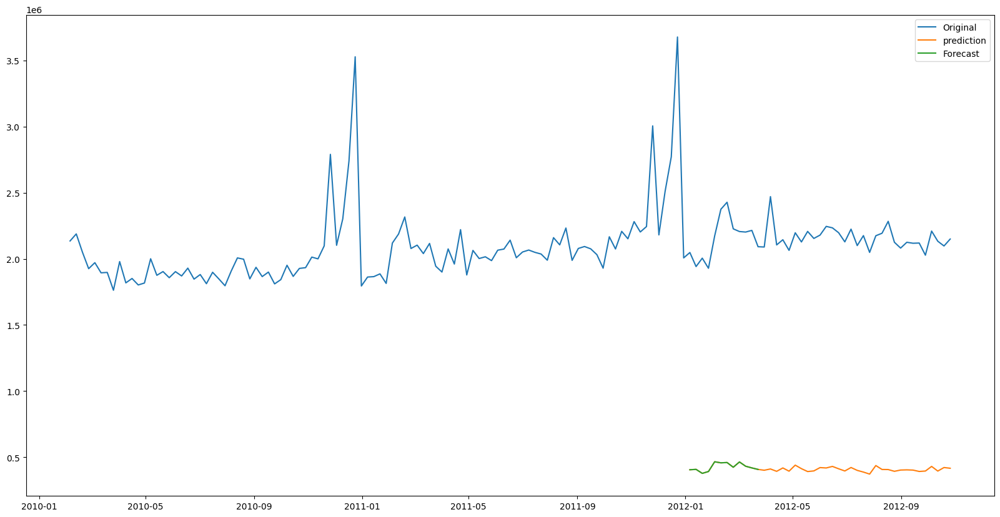

In [222]:
plt.figure(figsize=(20,10))
plt.plot(store4['Weekly_Sales'],label="Original")
plt.plot(pred,label="prediction")
plt.plot(forecast,label="Forecast")
plt.legend()
plt.show()

# Foresting Week_Sales for 45 Stores

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


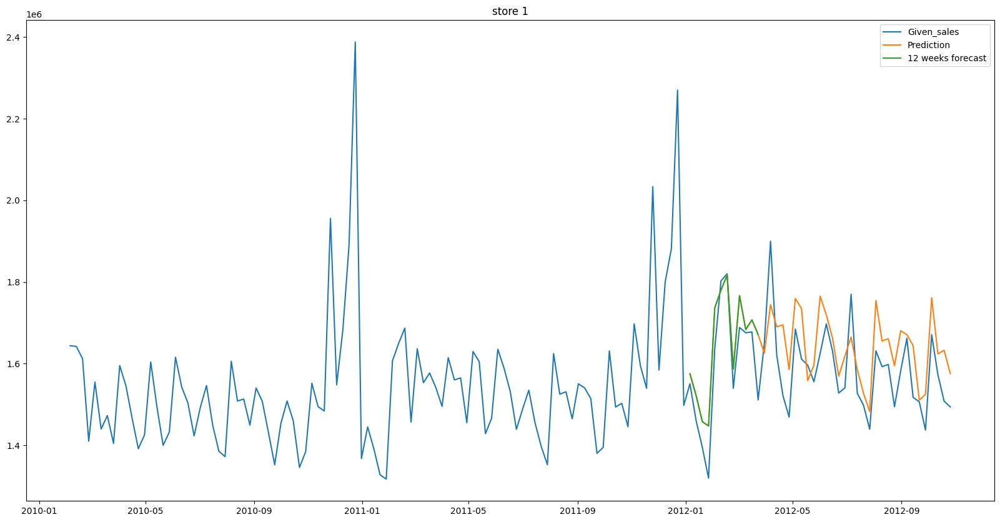

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


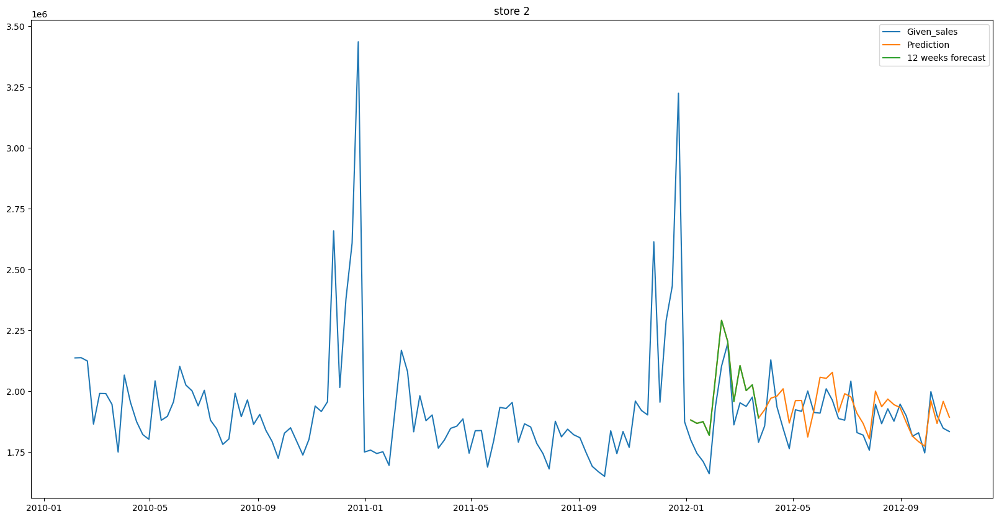

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


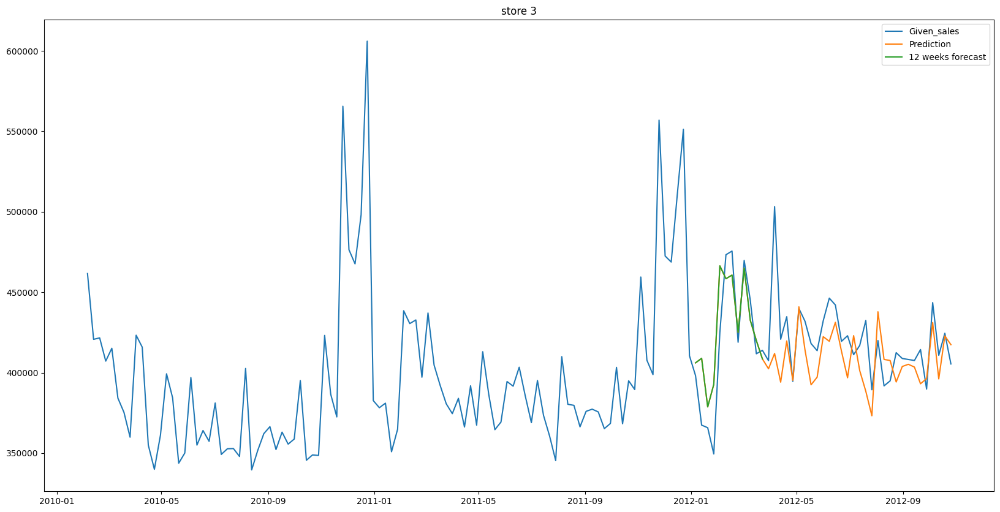

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


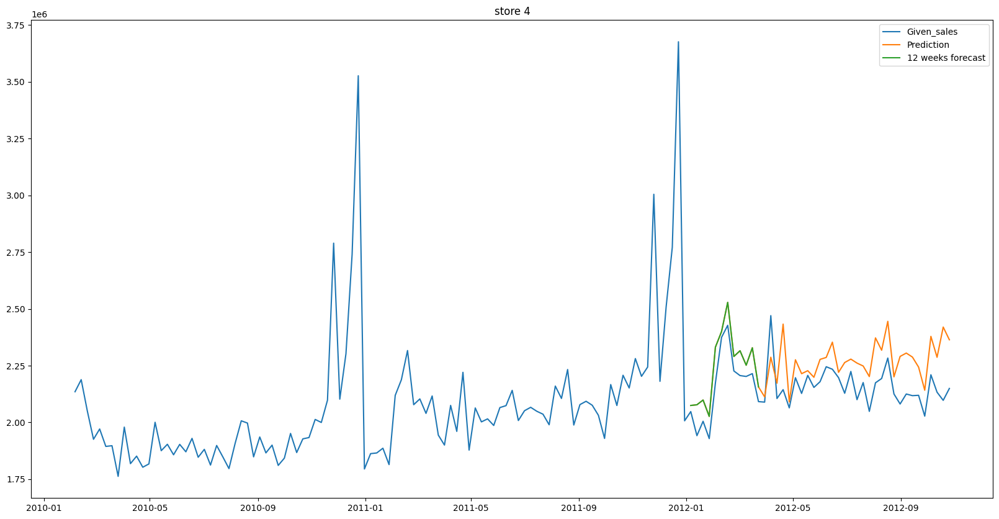

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


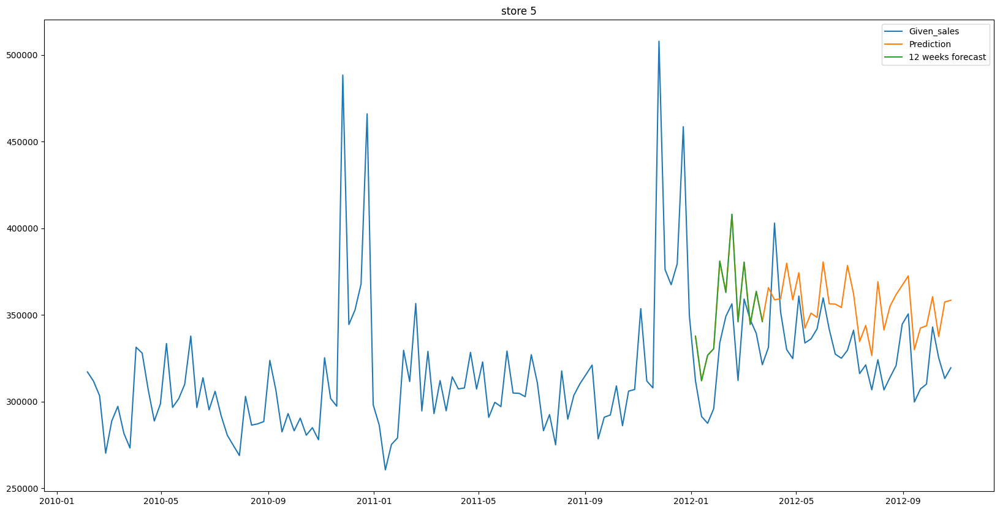

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


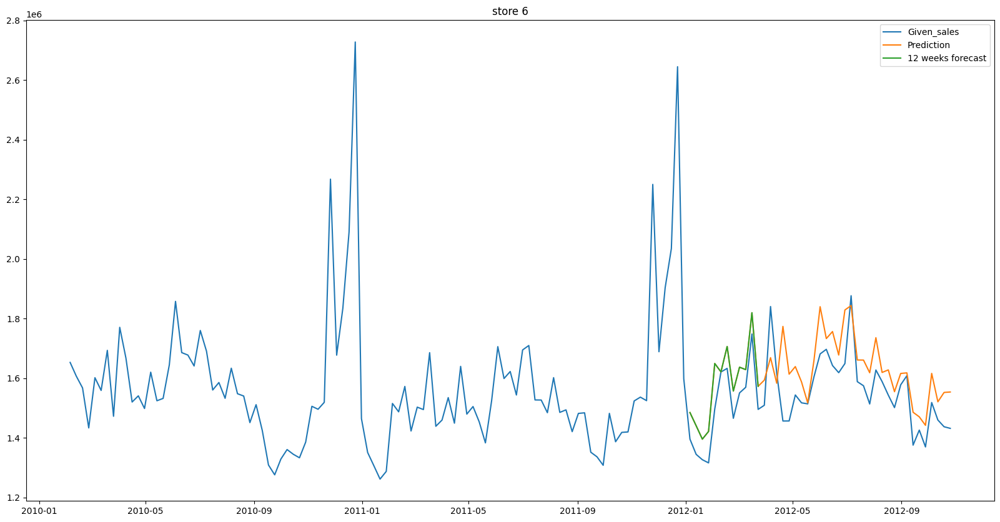

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


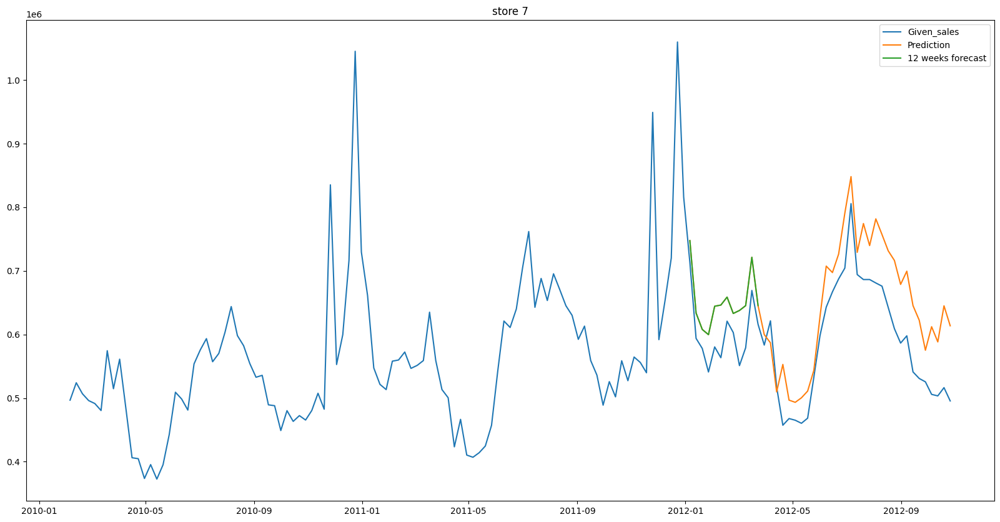

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


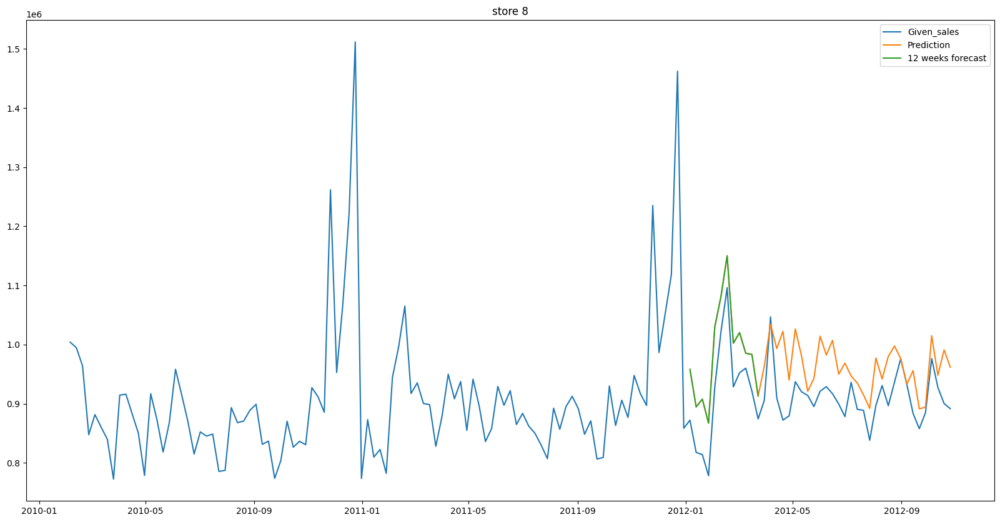

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


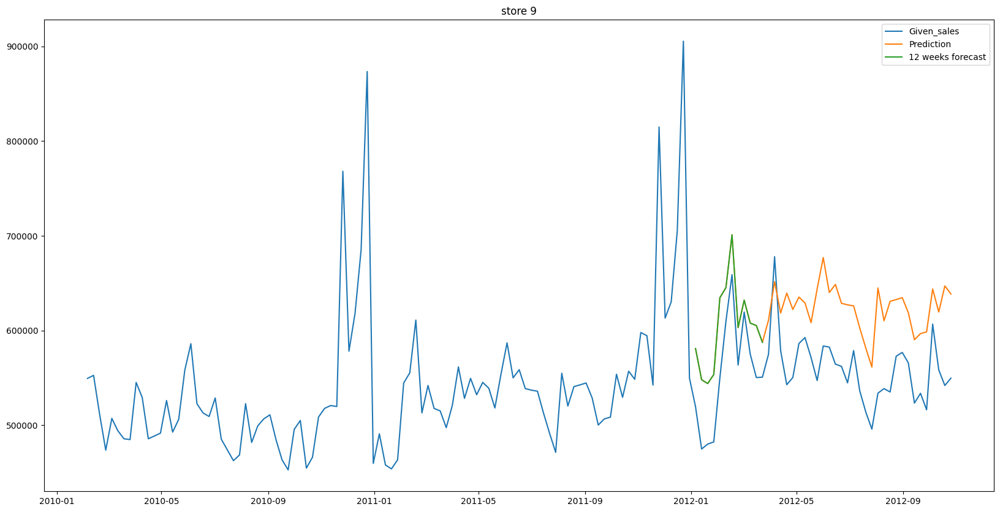

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


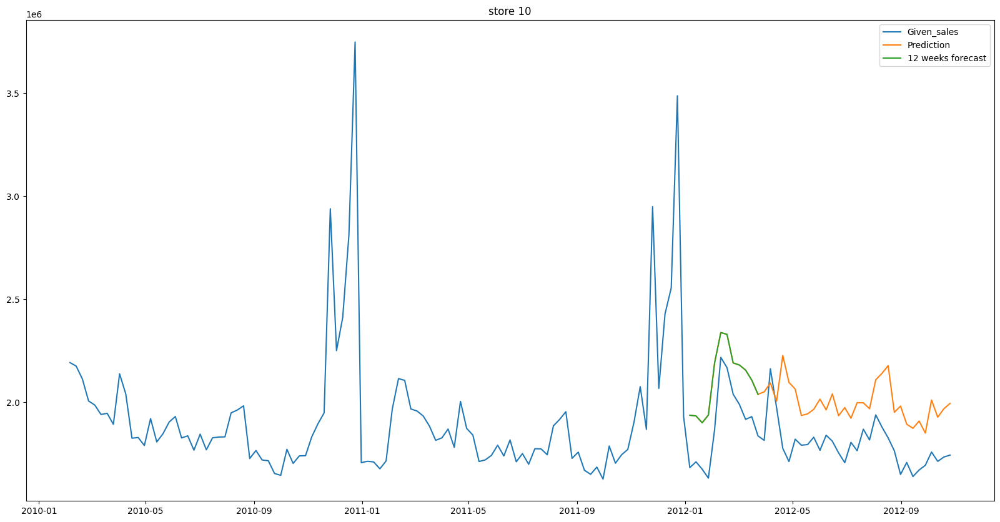

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


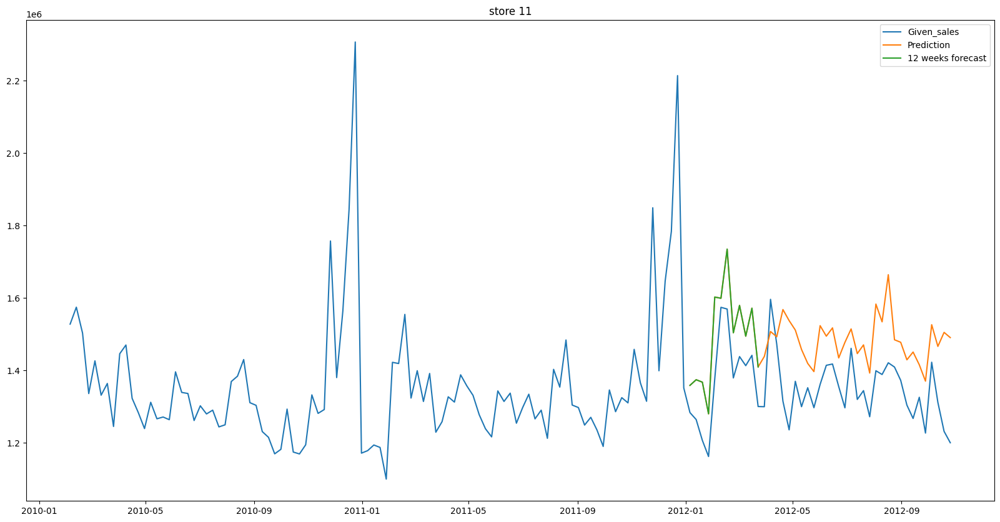

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


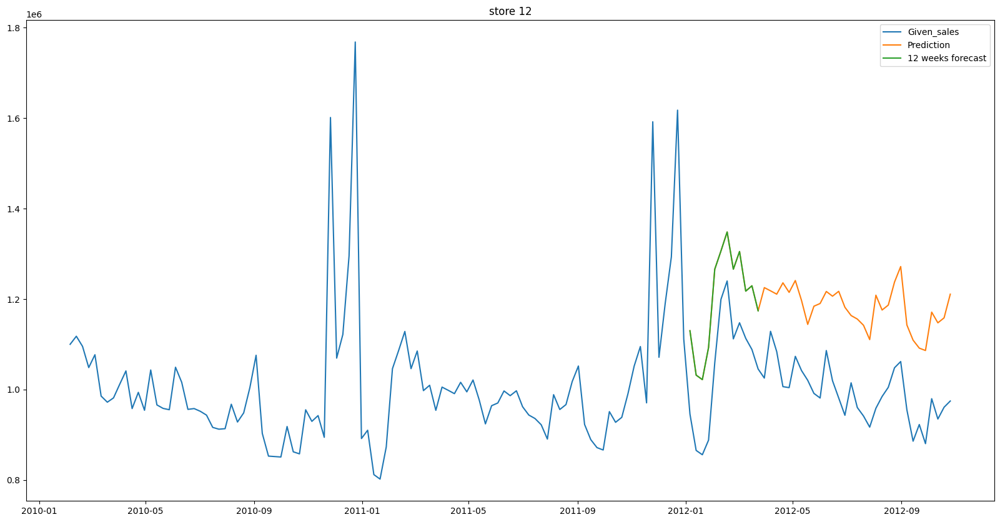

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


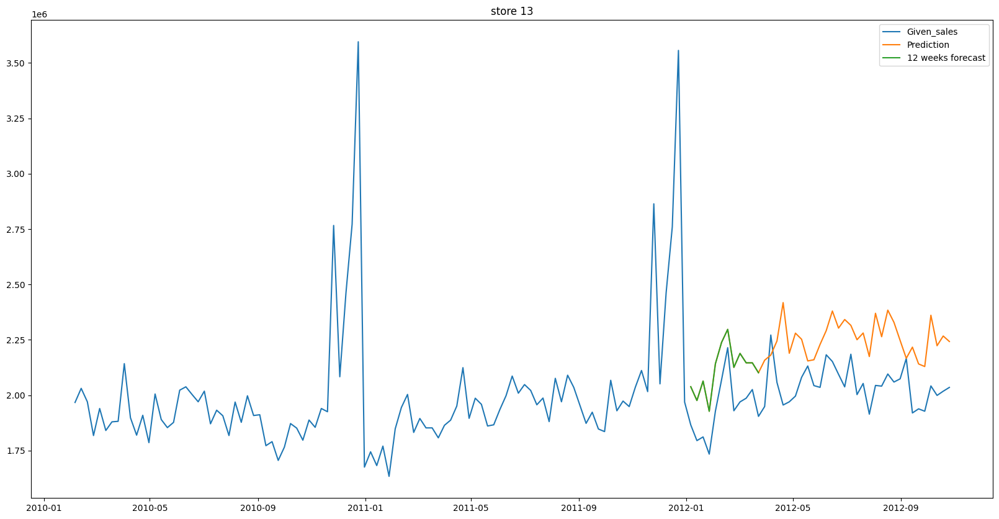

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


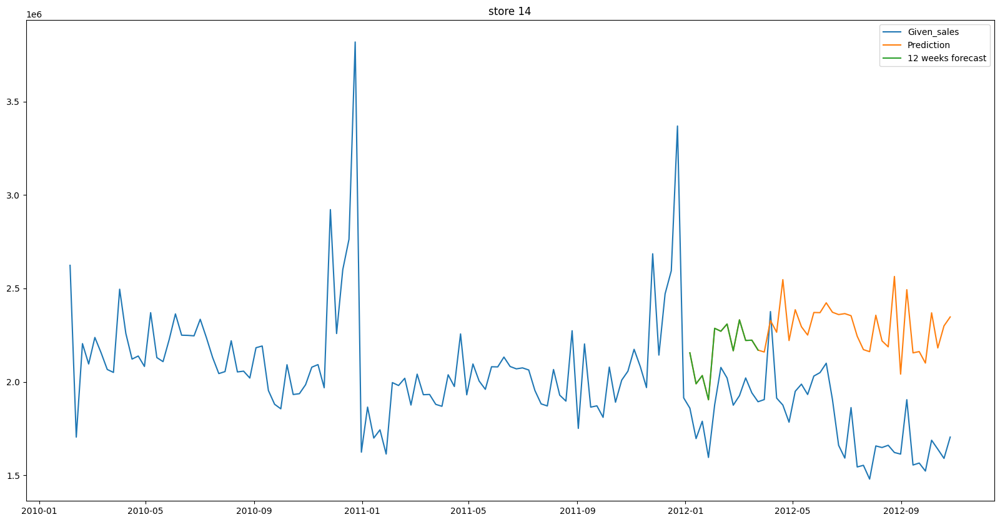

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


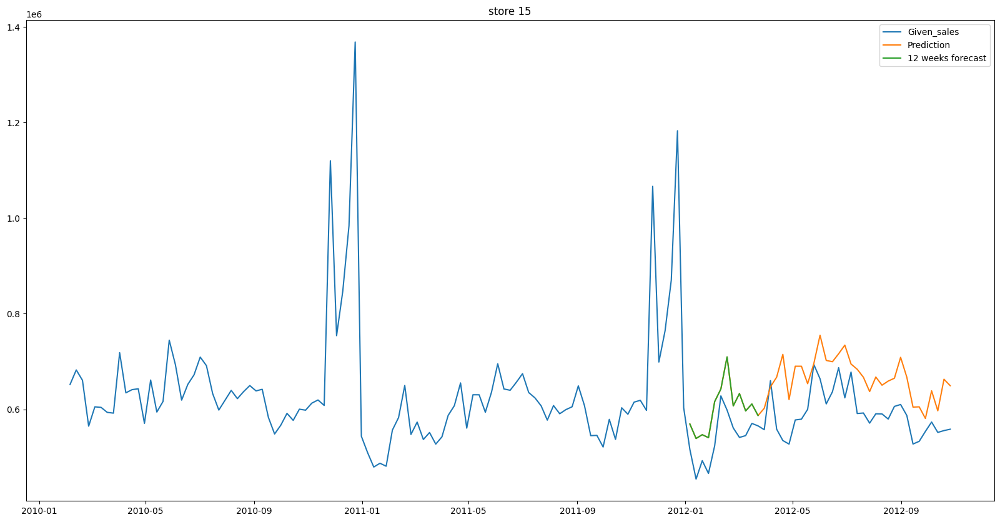

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


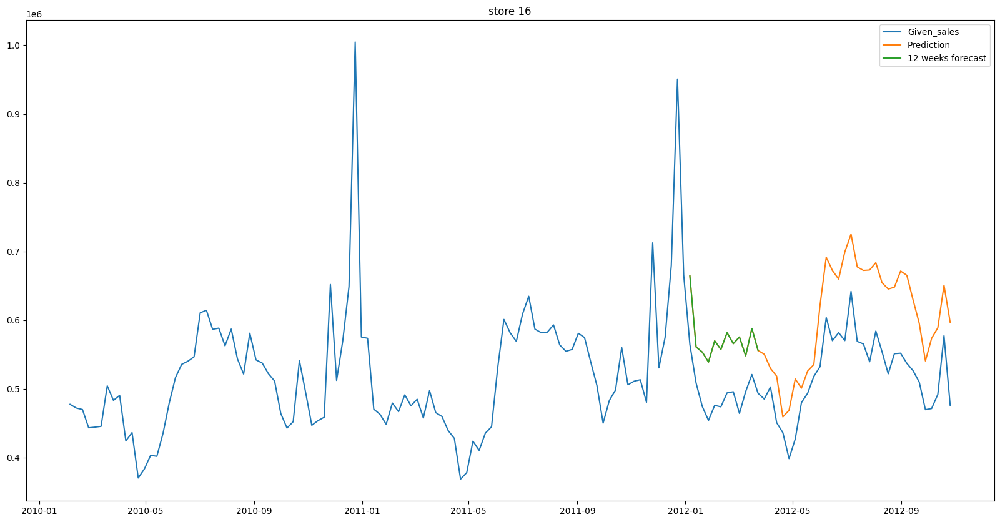

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


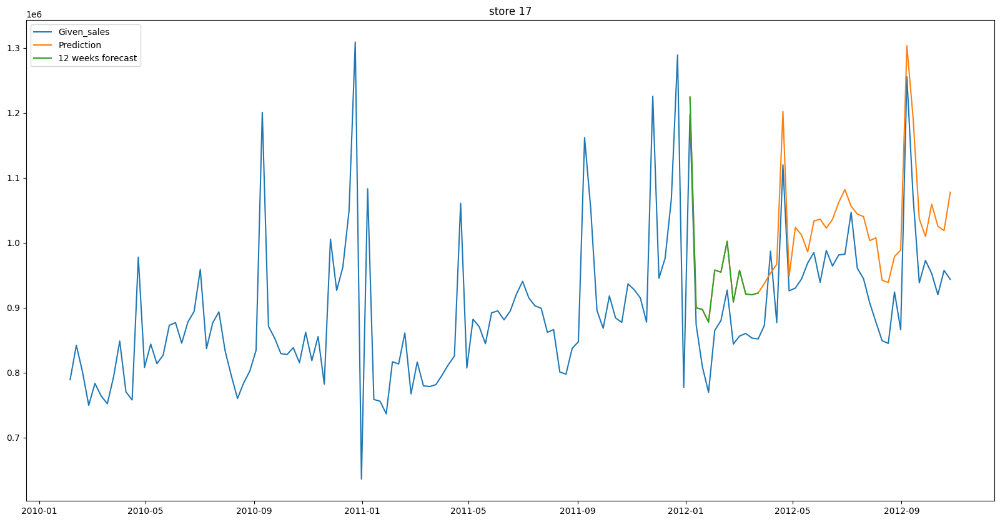

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


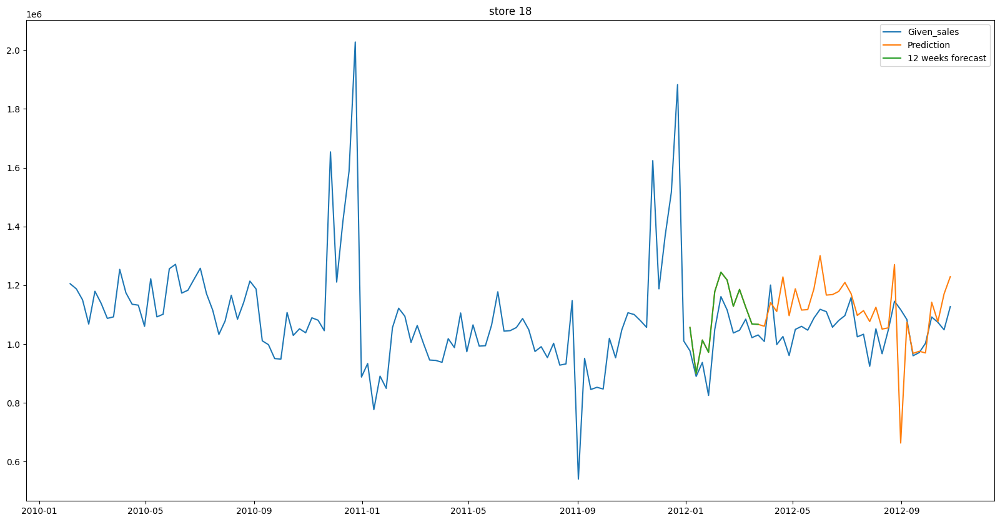

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


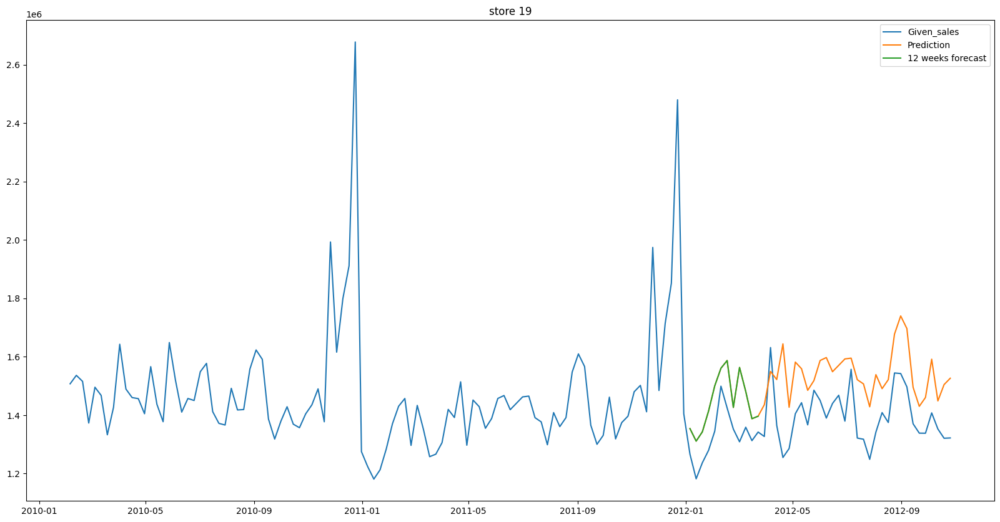

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


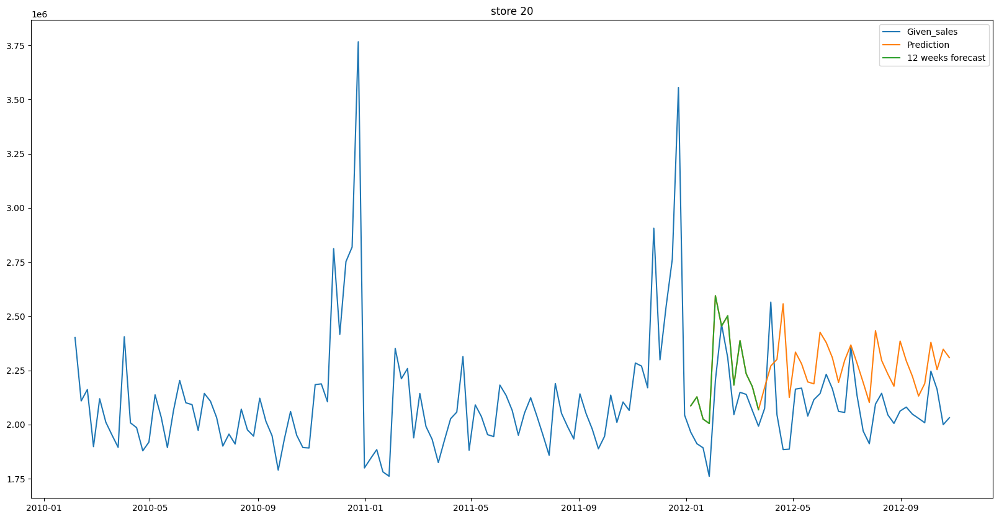

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


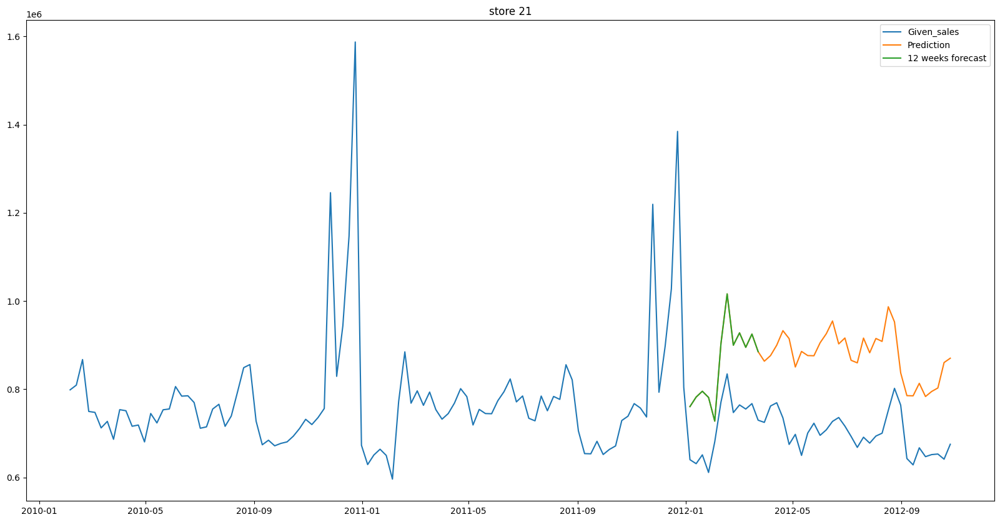

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


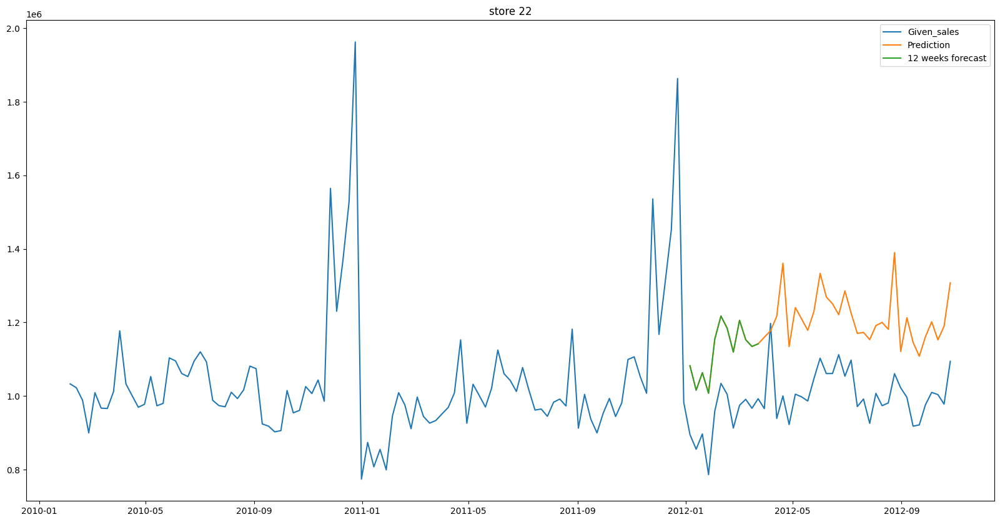

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


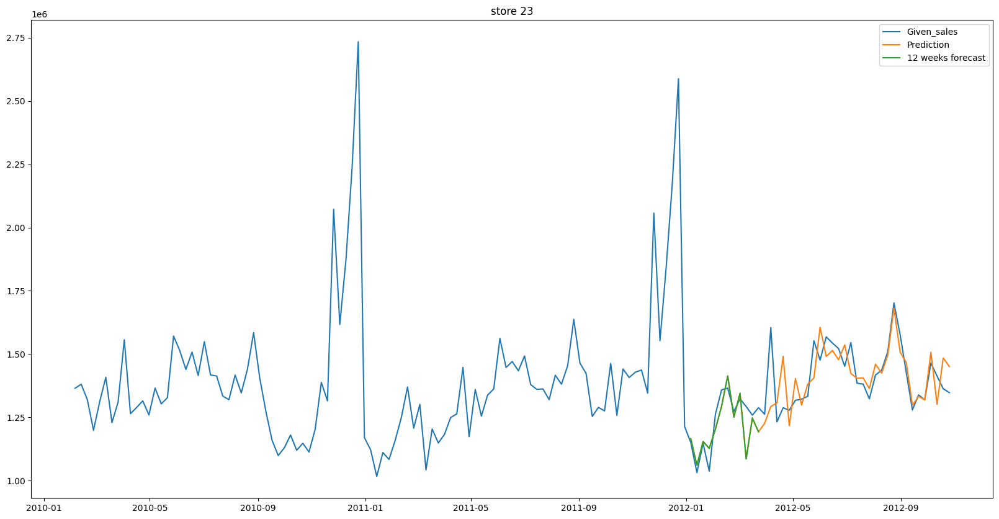

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


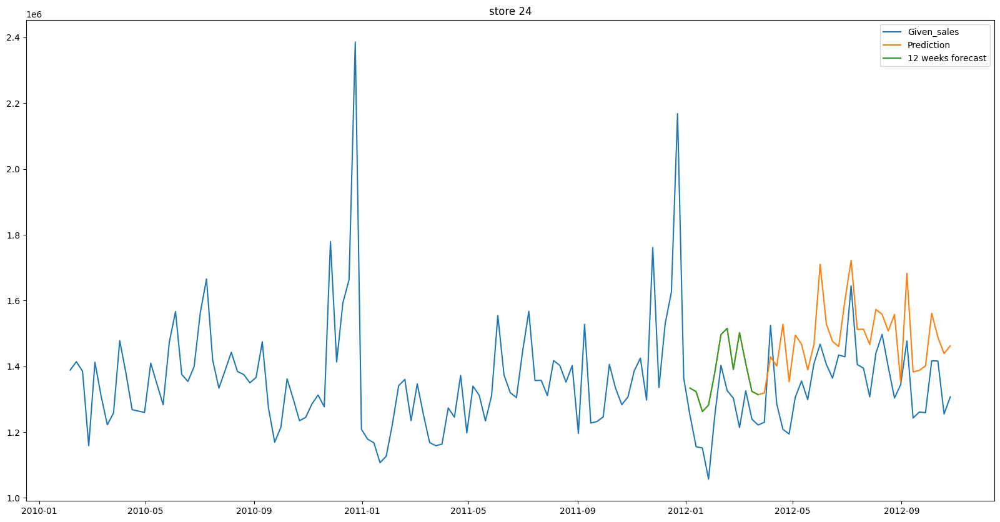

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


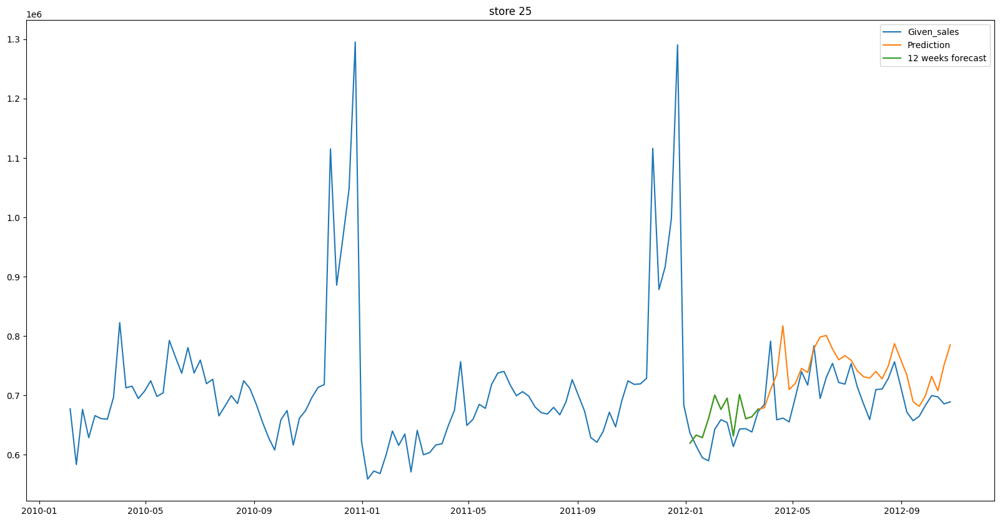

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


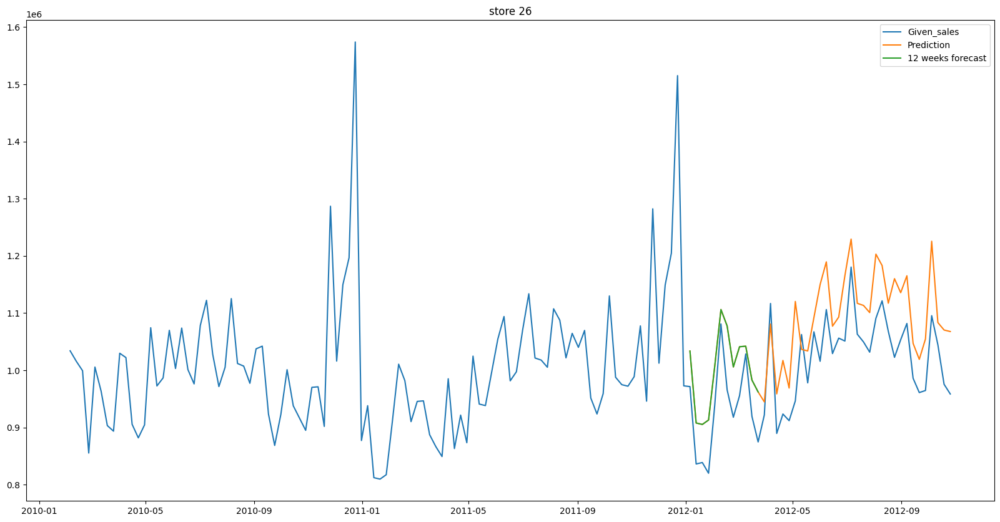

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


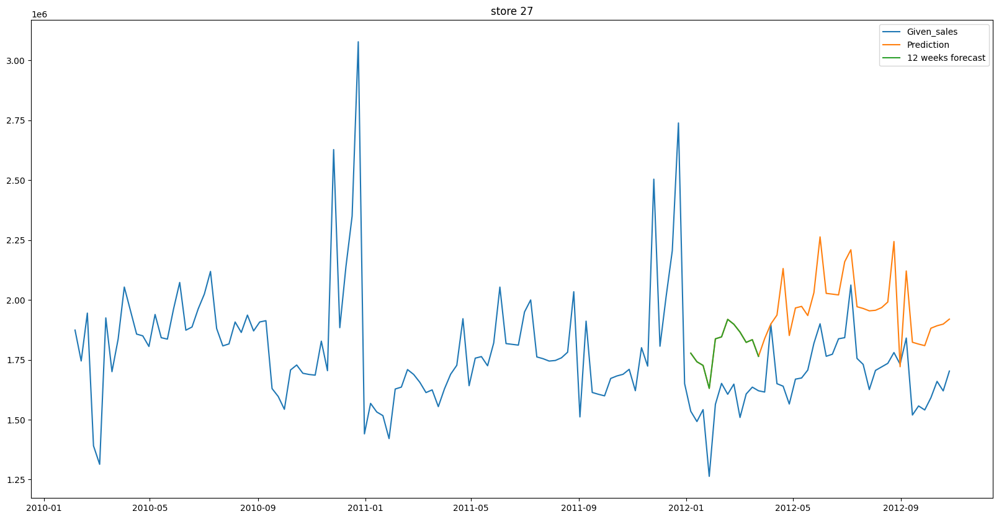

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


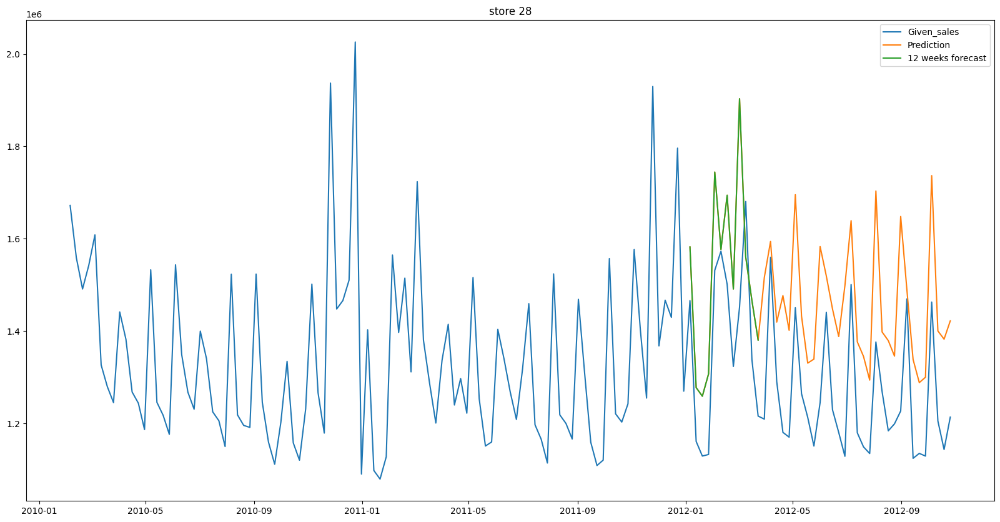

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


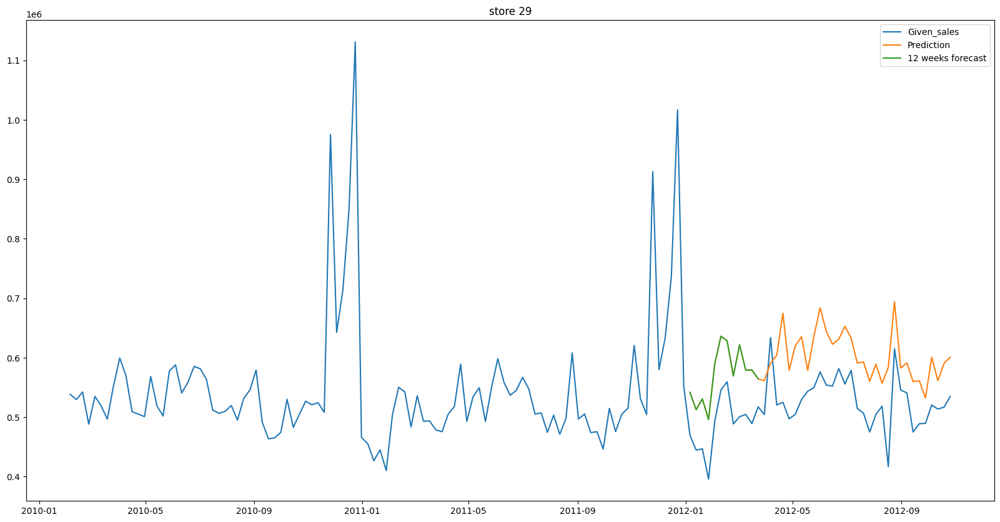

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


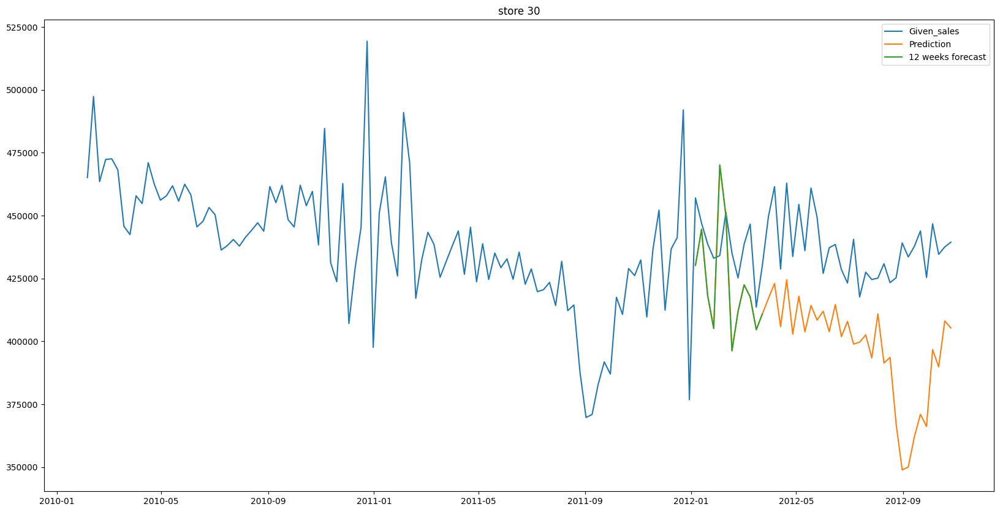

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


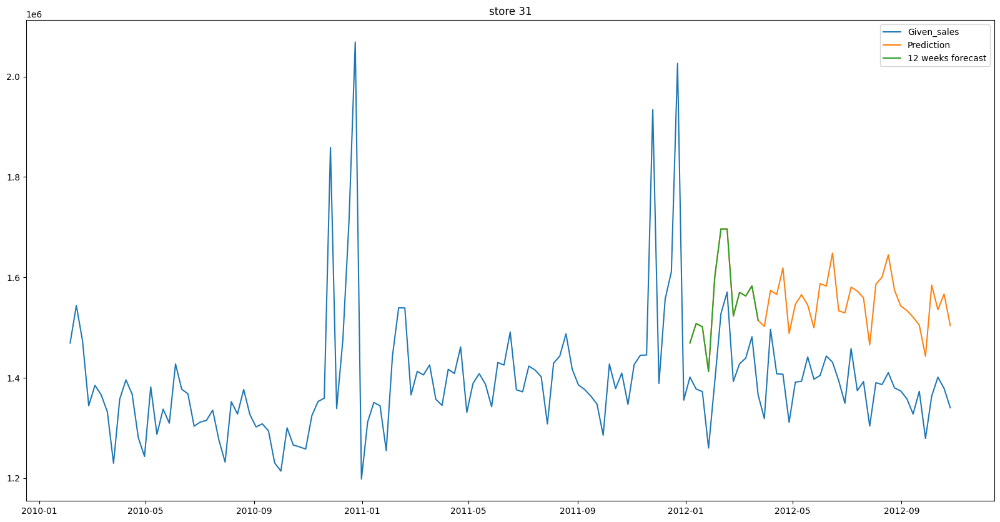

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


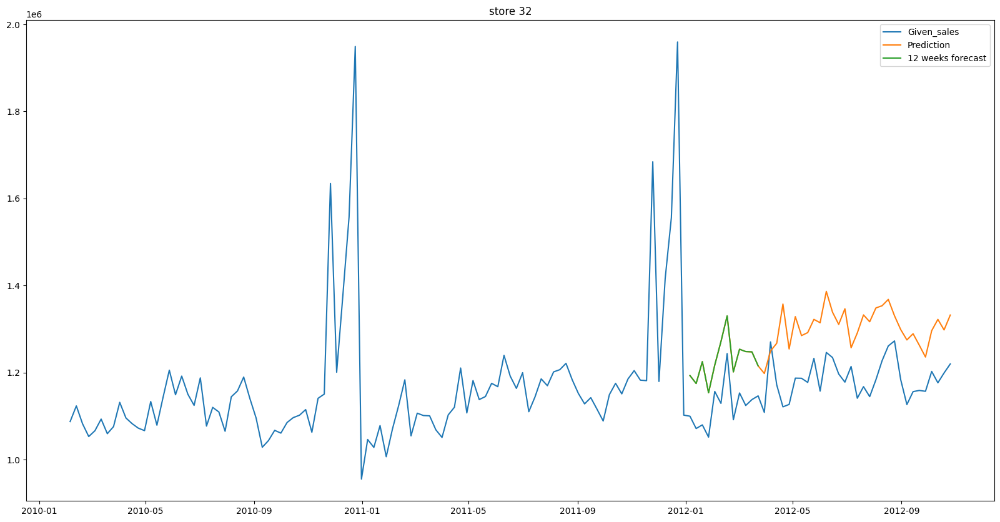

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


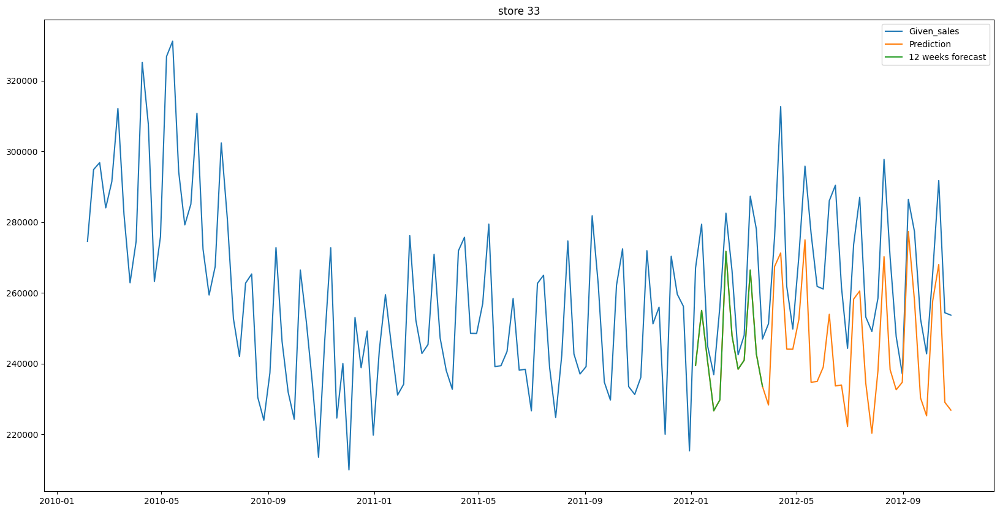

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


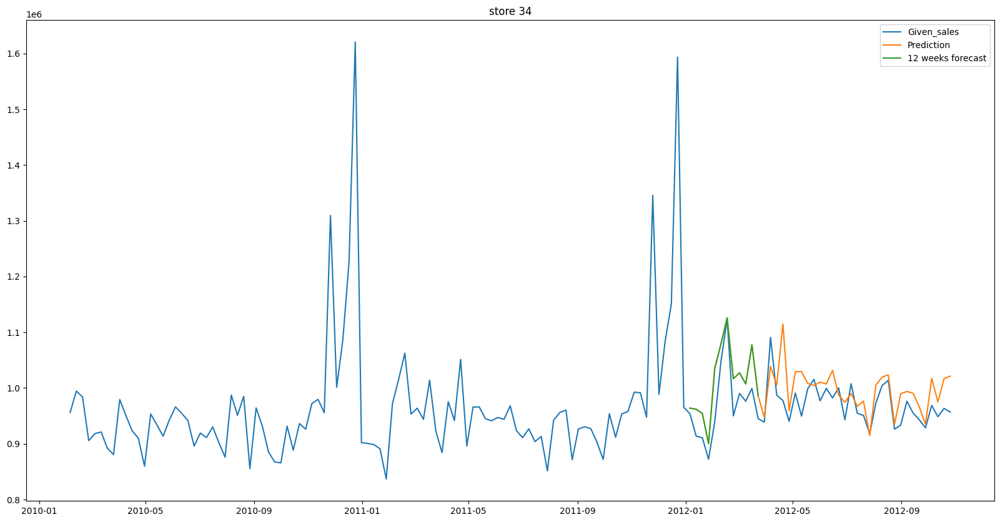

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


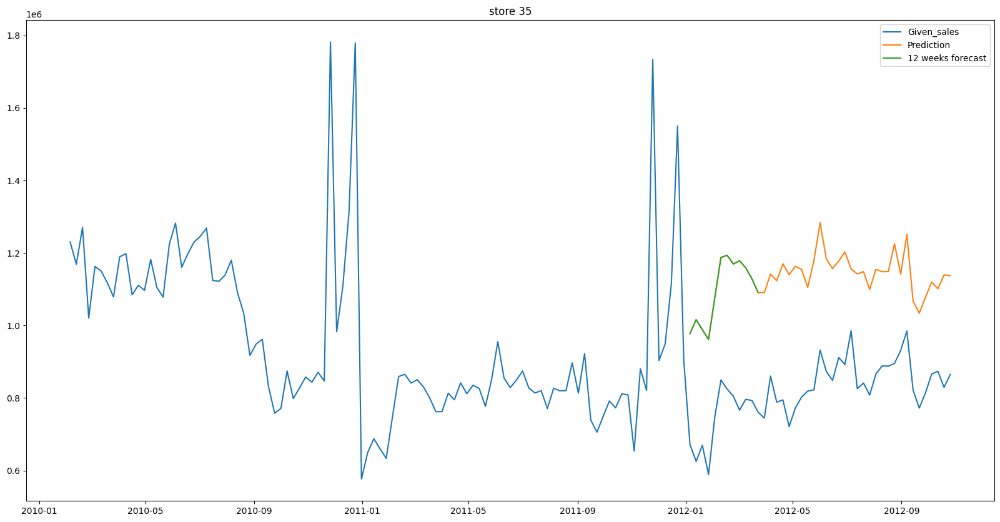

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


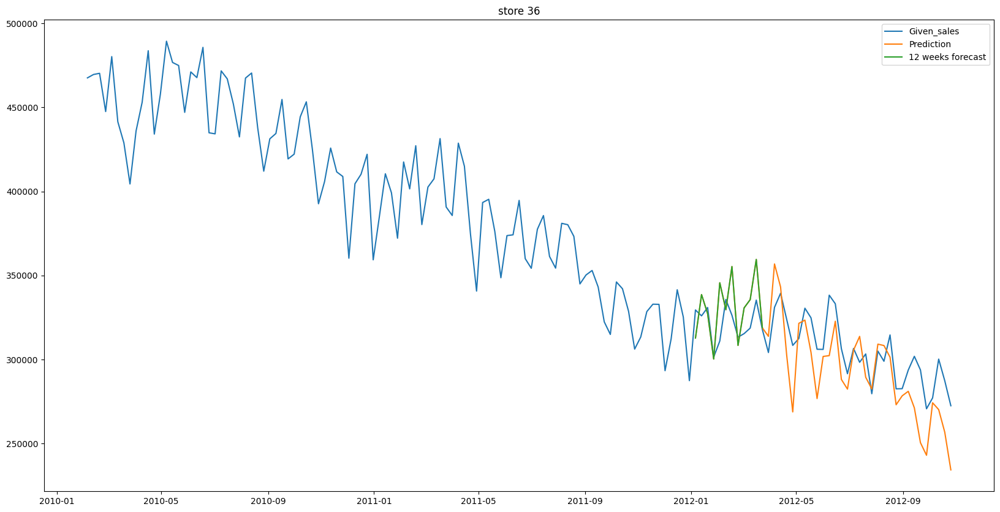

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


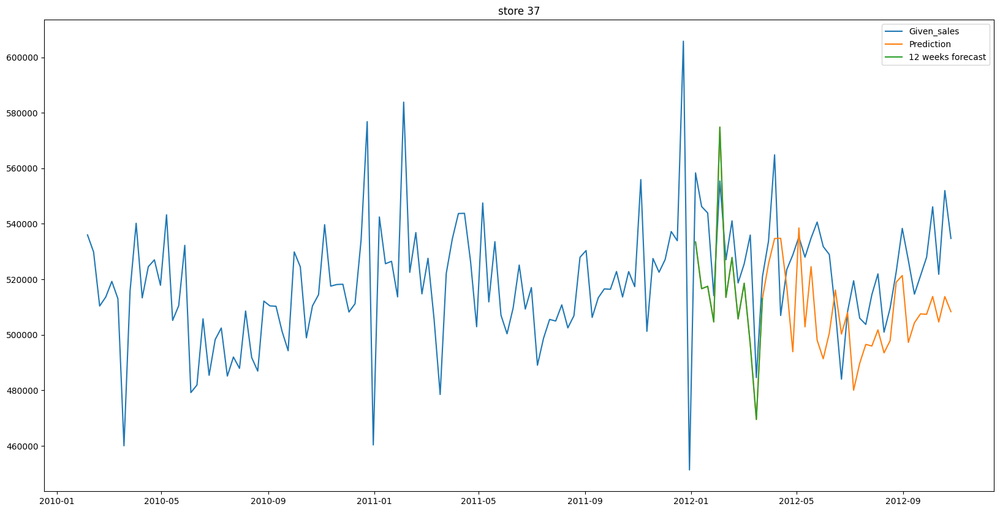

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


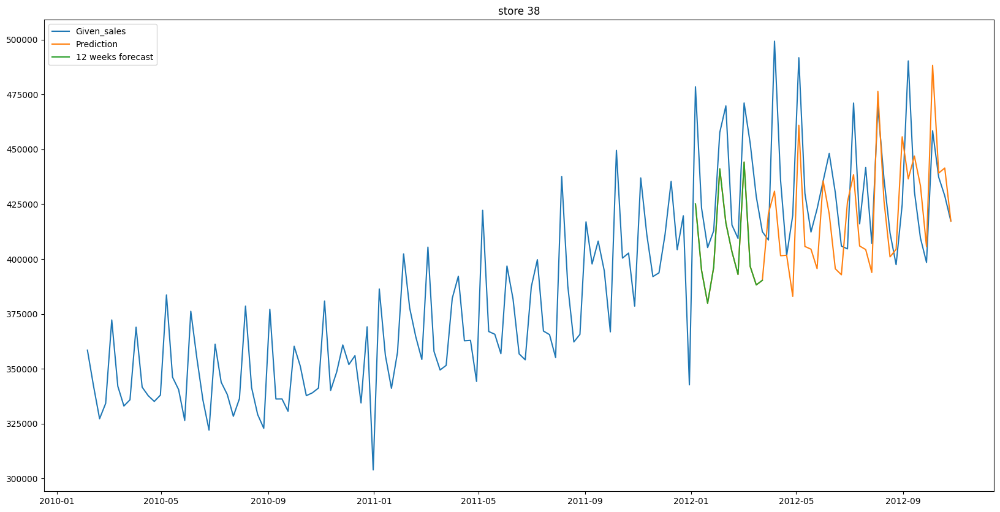

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


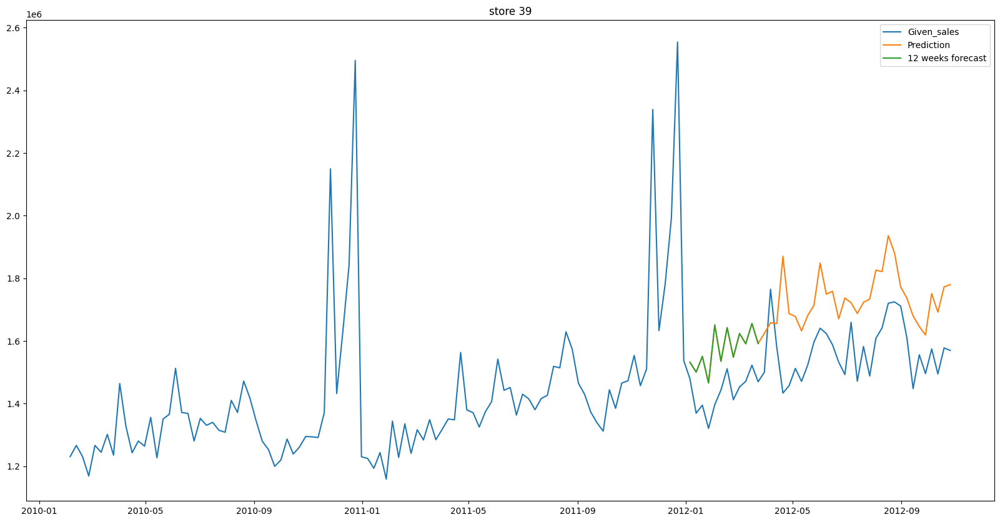

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


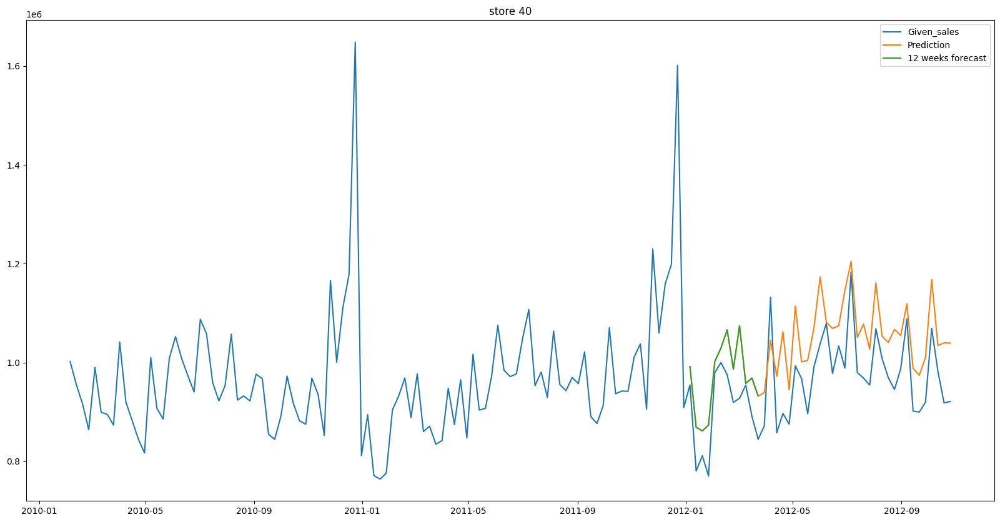

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


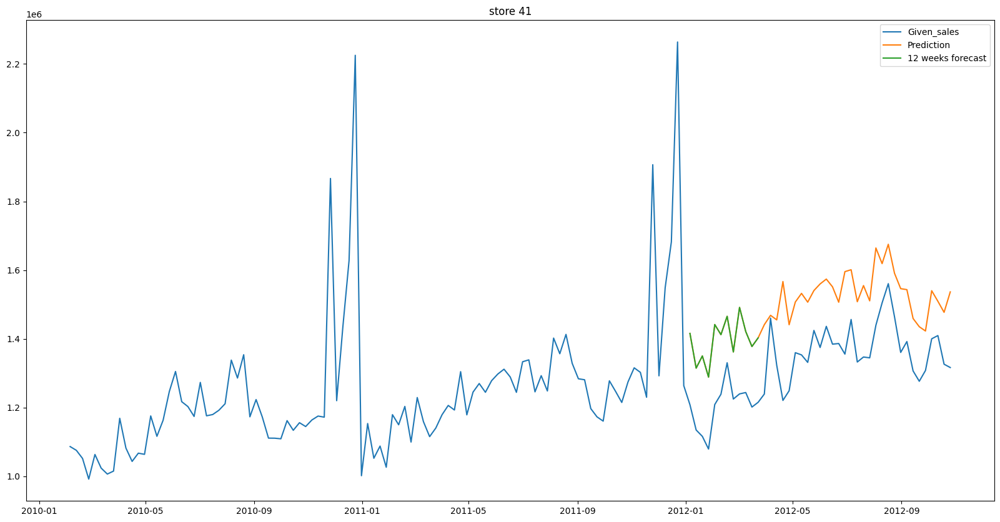

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


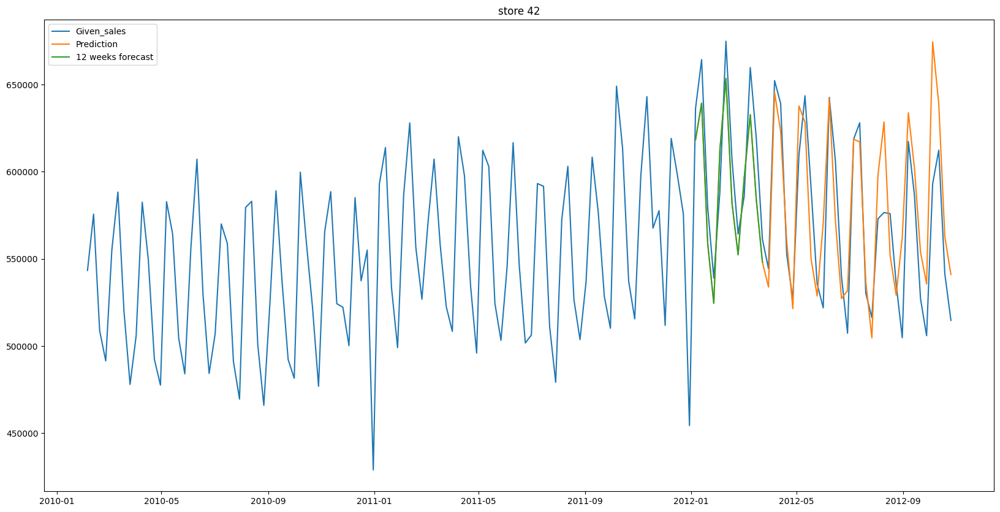

C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\praty\AppData\Local\Programs\Python\Python310\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


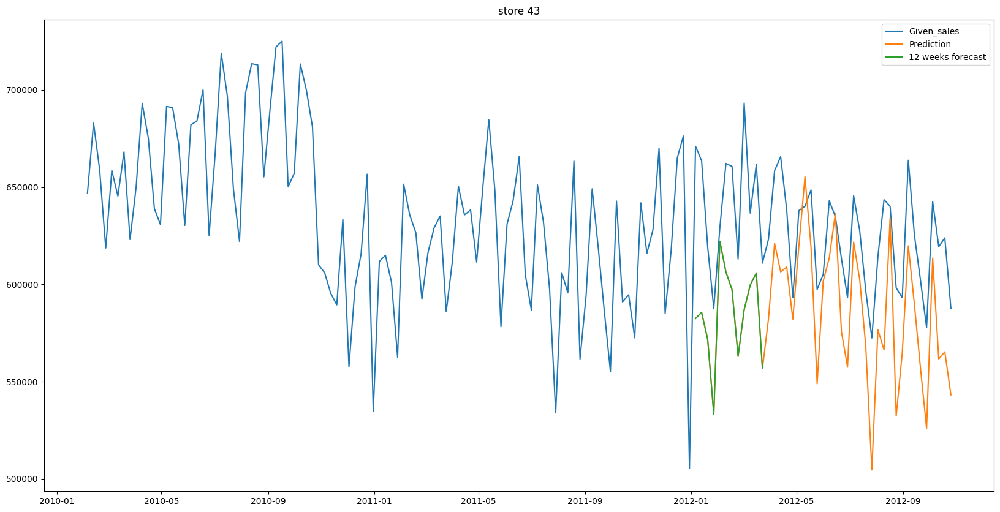

In [ ]:
for i in range(1,46):
    new_data=pd.DataFrame(df[df["Store"]==i]["Weekly_Sales"])
    lag52=pd.DataFrame(new_data["Weekly_Sales"].diff(52))
    acf_values,confidence_intervals=sm.tsa.acf(lag52.dropna(),nlags=20,alpha=0.05)
    pacf_values=sm.tsa.pacf(lag52.dropna(),nlags=20)
    significant_acf = []
    significant_pacf = []
    for lag,acf,confident in zip(range(len(acf_values)),acf_values,confidence_intervals):
        if(abs(acf)>confident[1]):
            significant_acf.append(acf)
        else:
            break
    for lag,pacf,confident in zip(range(len(pacf_values)),pacf_values,confidence_intervals):
        if(abs(acf)>confident[1]):
            significant_pacf.append(acf)
        else:
            break
    p=len(significant_acf)
    q=len(significant_pacf)
    train=new_data[:round(len(new_data)*0.7)]
    model=SARIMAX(train,order=(p,1,q),seasonal_order=(p,1,q,52))
    model_fit=model.fit()
    pred=model_fit.predict(start=len(train),end=len(new_data)-1,dynamic=True)
    forecast=model_fit.forecast(steps=12)
    plt.figure(figsize=(20,10))
    plt.plot(new_data['Weekly_Sales'],label='Given_sales')
    plt.plot(pred,label='Prediction')
    plt.plot(forecast,label="12 weeks forecast")
    plt.legend()
    plt.title(f'store {i}')
    plt.show()
    
  


- **From the Above visualization we can observe the next 12 weeks sales of the 45 Stores of Walmart.**